In [1]:
#| echo: false

# code for corpus extraction

# libraries imported

from bs4 import BeautifulSoup
import future
import pandas as pd
import csv
import itertools
import uuid
import requests
import re
from IPython.display import display, Markdown
from tqdm import tqdm
tqdm.pandas()
import matplotlib.pyplot as plt

# link for digitized text of Natural History_book1-11
url1 = "https://topostext.org/work/148"

# link for digitized text of Natural History_book12-37
url2 = "https://topostext.org/work/153"

# function for text with geographical name annotation scraping

def toposgeotext(url):
    response = requests.get(url)
    if response.status_code != 200:
        raise FileNotFoundError("Failed to retrieve HTML content: " + url)

    data = []
    soup = BeautifulSoup(response.content, features="lxml")
    links = soup.find_all("a", {"class": "place"})

    for link in links:
        Place_Name = link.contents[0]  # Place name
        ToposText_ID = link.get('about')  # ToposText ID
        Lat = link.get('lat')
        Long = link.get('long')
        Parent = link.find_parent("p")
        Text = Parent.text  # Extract related text
        Reference = Parent.get("id")  # Indicate book, chapter, paragraph

        # Separate the information in Text using the regular expression pattern
        match = re.search(r'§\s+(\d+\.\d+\.\d*)\s+(.*)$', Text)
        if match:
            Chapternparagraph = match.group(1)  # Extract the reference from the pattern
            Text = match.group(2)  # Extract the remaining text from the pattern
            
            # Extract the book, chapter, and paragraph components
            book, chapter, paragraph = Chapternparagraph.split('.')
            
            UUID4 = uuid.uuid4()  # Create a unique ID

            data.append({
                'UUID4': UUID4,
                'ToposText_ID': ToposText_ID,
                'Place_Name': Place_Name,
                'Reference': Reference,
                'Lat': Lat,
                'Long': Long,
                'Book': book,  # Add the book component to the DataFrame
                'Chapter': chapter,  # Add the chapter component to the DataFrame
                'Paragraph': paragraph,  # Add the paragraph component to the DataFrame
                'Text': Text
            })

    df = pd.DataFrame(data)
    # Convert data types to numeric
    df['Book'] = pd.to_numeric(df['Book'], errors='coerce')
    df['Chapter'] = pd.to_numeric(df['Chapter'], errors='coerce')
    df['Paragraph'] = pd.to_numeric(df['Paragraph'], errors='coerce')
    return df

# construct the dataframe for two parts of the digitized text with geographical annotations with the toposgeotext function
geodf1 = toposgeotext(url1)
geodf2 = toposgeotext(url2)

geotext_whole = pd.concat([geodf1, geodf2], ignore_index=True)

geotext_whole.to_csv('geotext_whole.csv')

# function for scraping entire text from ToposText with given html

def topostext(url):
    response = requests.get(url)
    if response.status_code != 200:
        raise FileNotFoundError("Failed to retrieve HTML content: " + url)
    
    data = []
    soup = BeautifulSoup(response.content, features="lxml")
    links = soup.find_all("p")  # Find all <p> tags instead of filtering by class

    for link in links:
        match = re.search(r'§\s+(\d+\.\d+\.\d*)\s+(.*)$', link.text)
        if match:
            Chapternparagraph = match.group(1)  # Extract the reference from the pattern
            # Extract the book, chapter, and paragraph components
            book, chapter, paragraph = Chapternparagraph.split('.')
            Text = match.group(2)  # Extract the text from the pattern
            Reference = link.get("id")  # Indicate book, chapter, paragraph
            UUID4 = uuid.uuid4()  # Create a unique ID

            data.append({
                'UUID4': UUID4,
                'Reference': Reference,
                'Book': book,  # Add the book component to the DataFrame
                'Chapter': chapter,  # Add the chapter component to the DataFrame
                'Paragraph': paragraph,  # Add the paragraph component to the DataFrame     
                'Text': Text
            })

    df = pd.DataFrame(data)
    # Convert data types to numeric
    df['Book'] = pd.to_numeric(df['Book'], errors='coerce')
    df['Chapter'] = pd.to_numeric(df['Chapter'], errors='coerce')
    df['Paragraph'] = pd.to_numeric(df['Paragraph'], errors='coerce')
    return df

# construct the dataframe for two parts of the digitized text with the topostext function
df1 = topostext(url1)
df2 = topostext(url2)

# combine the two parts of scraped text
wholebook = pd.concat([df1, df2], ignore_index=True)

# store the scraped text into csv file
wholebook.to_csv('wholebooktext.csv')

## Introduction {#sec-introduction}

### *Natural History* and its complexity
Pliny the Elder's *Natural History* is widely recognized as the earliest encyclopedia in the world, manifesting a pioneering effort in comprehensively cataloging the vast array of human knowledge from that era. 

The work is thematically divided into 37 books, covering a diverse range of subjects including astronomy, geography, zoology, botany, medicine, and more. Pliny meticulously consulted a wide range of Greek and Roman references, totaling approximately 2,000 volumes^[*Natural History* 1.5.1 (<a href="https://topostext.org/work/148" target="_blank">https://topostext.org/work/148</a>)], and interwove his own literary interpretation or comments to the narratives.

Despite the carefully designed knowledge-ordering framework [@lao2016], scholars have observed a paradoxical complexity in *Natural History*, evident in its linguistic style, narrative approach, and use of references. The work compiles inconsistent toponyms from Greek and Latin, includes digressions in descriptions [@roller2022], exhibits changes in vocabularies and sentence structures  [@pinkster2005]. However, it is precisely this complexity that makes the work more fascinating and not only a valuable source to the knowledge and worldview of the ancient world, but also a gateway into Pliny's conceptualization, imagination, and even the prevailing imperial ideology.

The complexity and interconnectivity of the general structure of *Natural History* is further highlighted in different aspects by refreshing approaches. In terms of content organization of the work, @healy1999 vandicated Pliny's original contribution in unveiling the technology and science engagement of the Rome Empire from the description about natural phenomena and scientific experiment to the development of scientific language in Latin, taking the historical, political and liguistic context into consideration. And @naas2002 discussed how Pliny formulated the the diversed materials into his encyclopaedic structure, revealing the work's multifaceted nature as an epistemological, ideological, and moral project. By analysing Pliny's employment of the historical exemplum in the work, @schultze2011 argues how the specific literary device directed and teased the readers and established a profound connection between human beings and the entire spectrum of nature in *Natural Hisroty*.


In addition to the close reading methods used in the prior analyses of the context and references in *Natural History*, @rydberg-cox2021 employs network analysis method with different metrics to map the interrelationships between Pliny's sources and the topics discussed in the work. Furthermore, @fantoli2022 presents a comparative study of book 2 of *Natural History* and book 7 of Seneca’s work *Natural Questions*, both centered on astronomy, utilizing statistical analysis to identify Pliny's unique stylistic features based on variations in their discourse distribution, and proved the encyclopedic authorial intent shown in *Natural History* with correspondence and tree analysis. These two studies also demonstrate how distant reading methodologies offer novel insights into the understanding of ancient treatises.

### Spatial perstpective in *Natural History*
As pointed out by @beagon2011, differenciating from his pressedors, Pliny showed a "terrestrial curiosity" in *Natural History*, emphasizing a recognition of the physical, material world. In this regard, the vision of geography plays a pivotal role in distributing information, knowledge, and events throughout *Natural History*. 

Drawing from the long-established topographical and ethnographic traditions, Pliny seamlessly connects volumes dedicated to geography (books 3-6) with broader elements, activities, and cultural, historical, and societal contexts[@roller2022], exemplified in his portrayal of exotic plants, communities' habitats, imperial expeditions, and trade ventures. In other words, geographical names occured in each book of *Natural History* served as signposts guiding readers through diverse lands, shedding light on how Pliny and his contemporaries perceived and conceptualized the world around them.

A normalized frequency of place name occurence in the work is calculated as the ratio of counts of the occurrences of place names in each book to the word lengths of the book (@tbl-place_book_distribution). The bar chart (@fig-place_distribution) depicted the comparison of distribution of place names in the books of *Natural History*. The observation is in line with content structure of *Natural History*, that books 3-6 centered around the themes of "Geography and ethnography", contains the most mentions of location names, and place names are also frequently referred in books about agriculture and horticulture (book 12-14), aquatic life (book 31), and mining and mineralogy (book 34-37).

In [2]:
#| label: tbl-place_book_distribution
#| tbl-cap: Normalized distribution of place names in *Natural History*
#| df-print: tibble

# Group the items by "Book" and calculate the total word length

book_word_lengths = wholebook.groupby('Book')['Text'].apply(lambda x: x.str.split().str.len().sum()).reset_index()
book_word_lengths.columns = ['Book', 'Total_length']
# Set the "Book" column as the index
book_word_lengths.set_index('Book', inplace=True)

place_counts = geotext_whole['Book'].value_counts().reset_index()
place_counts.columns = ['Book', 'Place_count']
place_counts.set_index('Book', inplace=True)

place_distribution = book_word_lengths.merge(place_counts, on='Book')
place_distribution['Place_freq'] = place_distribution['Place_count']/place_distribution['Total_length']

pd.options.display.width = 30
place_distribution

,Total_length,Place_count,Place_freq
Book,,,
1,2778,1,0.000360
2,30570,406,0.013281
3,18037,1007,0.055830
4,15434,1309,0.084813
5,18872,1112,0.058923
6,27891,1012,0.036284
7,21204,225,0.010611
8,24176,185,0.007652
9,19197,140,0.007293


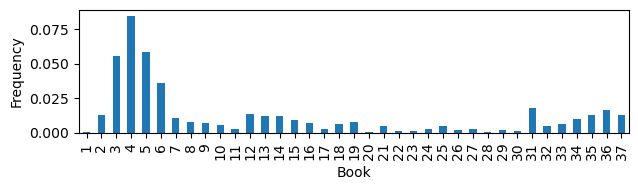

In [4]:
#| label: fig-place_distribution
#| fig-cap: Normalized distribution of place names in *Natural History*

fig, ax = plt.subplots(figsize=(8, 2))  # Adjust the figsize to increase the plot size

place_distribution['Place_freq'].plot.bar(ax=ax)
plt.xlabel('Book')
plt.ylabel('Frequency')

# Adjust the plot alignment
plt.tight_layout(rect=[0, 0, 0.8, 1])  # Change the rect values to adjust the alignment

plt.show()

### Text source for the study 
*Natural History* is originally written in Latin. For the purpose of this study, an English translation conducted by Henry T. Riley (1816-1878) and John Bostock (1773-1846), which was first published in 1855, is utilized. The translated text is obtained in a digitized version from the [TOPOSText project](https://topostext.org/the-project), having been sourced from the Perseus Project and governed by a Creative Commons Attribution-Share-Alike 3.0 U.S. License.

Annotations of people's name, places' name and geographical coordinates are available together with the text of *Natural History* ([Book1-11](https://topostext.org/work/148), [Book12-37](https://topostext.org/work/153)) on [TOPOSText project](https://topostext.org/the-project). This invaluable resource allows for the creation of a dataset that includes both the textual contents and geographical annotations, which can be utilized to investigate the distribution of place names in the entire text and examine the frequencies and patterns of geography-related content.

The extension of the extracted corpora and the workflow of the extraction will be further explained in the Methodology chapter (@sec-methodology).

## Research Question {#sec-research_question}

### Prominent mentioned places in *Natural History*

In [5]:
place_number = len(geotext_whole['ToposText_ID'].unique().tolist())

display(Markdown("""
Based on the geographical annotations in *Natural History* provided by TOPOSText project,
there are {place_number} unique places mentioned in *Natural History*.
""".format(place_number = place_number)))


Based on the geographical annotations in *Natural History* provided by TOPOSText project,
there are 2052 unique places mentioned in *Natural History*.


The top 20 most frequent place names mentioned (as 1% of total) in *Natural History* is shown in @tbl-topplace.

In [6]:
#| label: tbl-topplace
#| tbl-cap: Top 20 mentioned place names in Natural History
#| df-print: tibble

## sort the top 1% places referred in descending order

place = geotext_whole.groupby('ToposText_ID')[['Place_Name','Lat','Long']].value_counts().reset_index(name='Count')
sorted_place = place.sort_values(by='Count', ascending=False)
top_count = sorted_place.iloc[19]['Count']
topplace = sorted_place[sorted_place['Count'] >= top_count]
topplace

,ToposText_ID,Place_Name,Lat,Long,Count
1687,https://topostext.org/place/406163RIta,Italy,40.6,16.3,292
2034,https://topostext.org/place/419125PRom,Rome,41.891,12.486,269
52,https://topostext.org/place/271307REgy,Egypt,27.1,30.7,261
82,https://topostext.org/place/300740RInd,India,30,74,167
57,https://topostext.org/place/280400RAra,Arabia,28,40,123
320,https://topostext.org/place/355390RSyr,Syria,35.5,39,109
255,https://topostext.org/place/350330RCyp,Cyprus,35,33,85
109,https://topostext.org/place/312301WNil,Nile,30.0918,31.2313,85
2282,https://topostext.org/place/441073LAlp,Alps,44.142,7.343,82
766,https://topostext.org/place/376145RSic,Sicily,37.6,14.5,71


The place names referenced in *Natural History* are geographically mapped, with each location marked on the map using its corresponding coordinates. A dot is assigned to represent each place, with the size and color of the dot reflecting the frequency of its mention in the book. The larger and darker the dot, the more frequently the place is referenced within the context of Natural History.

An intriguing observation from the output, as depicted in @fig-geonamemap_pdf, is the prominence of India, a region outside the Mediterranean, despite its high frequency of mentions.

In [7]:
#| output: false
#| label: fig-geonamemap
#| fig-cap: Place name distribution map

import folium
from branca.colormap import LinearColormap

# Create a Folium map centered on a specific location
map = folium.Map(location=[32, 53], zoom_start=3)

# Define the minimum and maximum count values for the color scale
min_count = place['Count'].min()
max_count = place['Count'].max()

# Create a color map based on the count values
color_map = LinearColormap(colors=['#FFCC00', '#FF6600'],
                           vmin=min_count,
                           vmax=max_count)

# Iterate over each row in the dataframe
for index, row in place.iterrows():
    place_name = row['Place_Name']
    count = row['Count']
    latitude = row['Lat']
    longitude = row['Long']
    
    # Get the color based on the count using the color map
    color = color_map(count)
    
    # Create a circle marker with a size based on the count and color based on the count
    folium.CircleMarker(
        location=[latitude, longitude],
        radius=count/10,  # Adjust the size of the marker based on the count
        weight=0,
        fill=True,
        fill_color=color,
        fill_opacity=1,
        tooltip=f'{place_name}: {count} counts'
    ).add_to(map)

# Add the color scale to the map
color_map.caption = 'Count'
color_map.add_to(map)

# Display the map
map

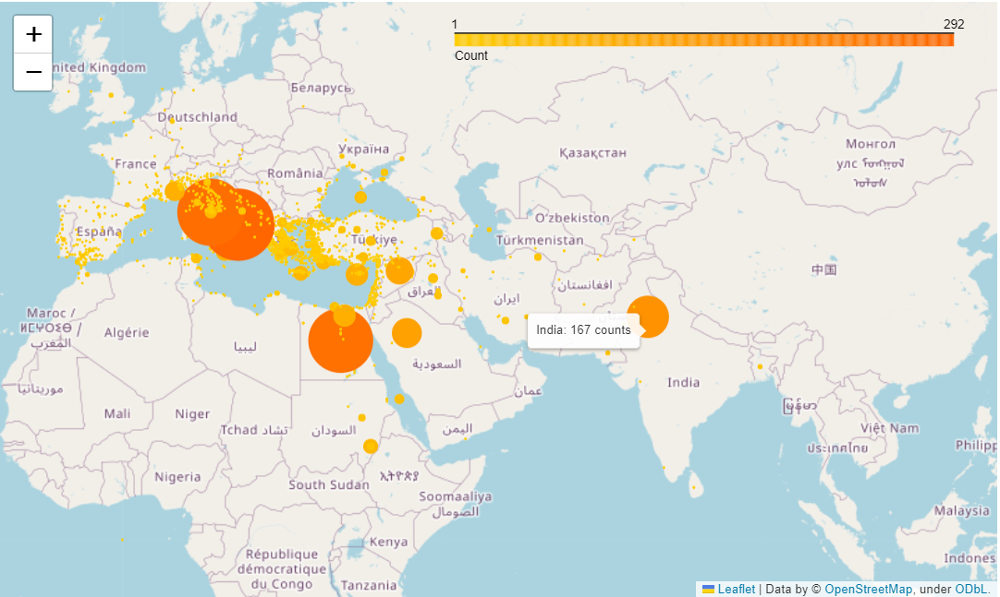

In [149]:
#| label: fig-geonamemap_pdf
#| fig-cap: Place name distribution map

from IPython.display import Image
Image(filename='map_forpdf.png')

### Why India?

Geographically, India presents itself as a distant and disconnected territory from the Roman Empire, lacking any direct aquatic or land routes with the Mediterranean region. Despite this apparent physical separation, the exotic curiosity Pliny attempted to integrate, as well as the Indo-roman goods exchange network reflected in the work, may contribute to an explaination of the prominent mentioning of India in *Natural History* as the broader context. 

As suggested by [@murphy2003], the *mirabilia*, encompassing accounts of extraordinary landscapes, peoples, plants, and animals, assumes a substantial proportion within the books of *Natural History*. Pliny's inclusion of such exotic elements not only catered to the prevailing curiosity of his Roman readers but also fostered a comparative perspective between distant locales, exemplified by his references to India, and their natural counterparts within Rome [@naas2011]. Within research framework of Roman Imperialism, the detailed portrayal of foreign lands, such as India, holds significant importance in shaping both Pliny's and his contemporary Roman readers' perception of their place within the global landscape [@pollard2009].

In addition, *Natural History* serves as a valuable reference for tracking the Indo-Mediterranean network of exchange [@pollard2009]. Through the depiction of cities, ports, and rivers along the trade routes, the work provides substantive evidence of the flourishing trade relations between the Roman Empire and the Indian subcontinent [@neelis2011]. The extensive exemplify of diverse commodities, such as gemstones, glass, spices, textiles, plants, wine, along with the accounts of the currency *sestertii* involved in the merchandise exchange in the work shed lights to the compelling details and social and cultural implications of this long-distance trade [@szekely2006; @pollard2009]. Furthermore, the direct criticisms regarding the high cost for the luxury items imported from India implies both the magnitude of the trade volume and Pliny's stance towards this commercial interaction [@neelis2011].

### India-related text as a case study

In light of the observations and foundational research mentioned above, the present study centers its investigation on the spatial perspective within Pliny's *Natural History*, with a specific focus on the texts pertaining to India, seeking to delve into the discourse surrounding this region. To achieve this goal, distant reading methodologies, including statistical analysis, topic modeling, and social network analysis, will be employed.

The main aim of this study is to explore how is India described, and how is the information about India structured in *Natural History*, which may also contribute to a more profound comprehension of the inherent complexity and interconnectivity that permeates this monumental work.

## Methodology {#sec-methodology}

### Workflow

The workflow for this study involved the following key stages: 

**Data Collection**:

As mentioned in the Introduction chapter (@sec-introduction), the text employed for this study is obtained from the digitized English translation (by Henry T. Riley (1816-1878) and John Bostock (1773-1846)) of Pliny's *Natural History* available on [TOPOSText project](https://topostext.org/the-project). 

The two parts of *Natural History* ([Book1-11](https://topostext.org/work/148), [Book12-37](https://topostext.org/work/153)) are scraped for their the textual contents together with the annotated information of the geographical coordinates of the ancient places mentioned in the work, and the book, chapter and paragraph affiliations with the function provided in [Beautiful Soup](https://www.crummy.com/software/BeautifulSoup/bs4/doc/) library of Python. 


**Data Preprocessing**:

The information extracted from the html is structured into separate columns as [Pandas](https://pandas.pydata.org/) dataframe, a dataframe for plain text of the entire work, and a dataframe for geographical-related text in *Natural History* with the geographical annotations are generated and stored in CSV format respectively.

After a preliminary exploration, the research focus is narrowed down to India-related text in *Natural History*. With a reference to the geographical territories in the consideration of ancient Greek and Roman world [@talbert2000], a dataframe for India-related text is filtered from the abovementioned dataframe for geographical-related text with the range of geographical coordinates of India subcontinent in the era of *Natural History*. The flitered India-related text dataframe is also stored in CSV format.

The location names mentioned in the India-related text were checked manually for its completeness. If any location names were identified and not being annotated in the TOPOSText, they were added to the India-related text dataset.

Additionally, the textual contents in the datasets were processed to make them suitable for textual analysis. This processing involved tokenization, lemmatization and the exclusion of stop-words.

**Data Analysis**:

Statistical analysis is conducted in the preliminary exploration of the extracted dataframes. A nomalized frequency of geographical name occurence in each book is calculated for an overview of the place name distribution in *Natural History*. And the top 1% prominently mentioned place names in the entire work are sorted out with the time of their occurencies. The specific attention on India-related text as a case study is drown from this initial observation.

In the analysis of the India-related text (target corpus) in *Natural History*, three analysis methods are employed:

1. Word frequency: single word frequency and bi-gram collocation of the target corpus are measured with the functions in [NLTK](https://www.nltk.org/) package for an overview of the keywords relating to India in *Natural History*.

2. Topic modeling: [Genism](https://radimrehurek.com/gensim/) library is used for semantic vectorization and implemetion of  Latent Dirichlet Allocation (LDA) model for the topic modeling of the India-ralated text, and the library of [pyLDAvis](https://pyldavis.readthedocs.io/en/latest/index.htmlgenism) is utilized for an interactive visualization. The output of this method shows the potential topics in the India-related text in *Natural History*.

3. Network analysis for Named Entities: Person names mentioned in the target corpus are retrieved from the tagging of the text given by the pretrained multilingual Named Entity Recognition model [Flair](https://huggingface.co/flair). The person name entities are cross checked with the annotation on TOPOSText. Stone names, river names, mountain names, person names and the book number are extracted as nodes, and the co-occurence between the nodes are calculated as edges for network analysis. The output of this method is a graph showing the clusters of the nodes in the target corpus, indicating the structure of the content related to India in *Natural History*.


**Interpretation and Conclusion**:

The workflow and parameter setting of each research method is explained in the beginning of each analysis section. The results aquired from each method is interpreted with a dialouge to the broader literature and close reading of the related text.

In the Conclusion chapter, the findings are illustrated comprehensively in the context of the research questions. And the limitations of each method is discussed and evaluated.

### Data preparation

The present section provides an overview of the data preparation process, encompassing three sub-sections: HTML scraping from TOPOSText, creation of a filtered dataset of "India-related text," completeness checks and preprocessing of textual data. The tools and procedures employed in data collection and dataset generation for the study are elucidated in the subsequent content.

#### HTML scraping  from TOPOSText

As previously stated, the textual contents of Pliny's *Natural History* are available on the [TOPOSText project](https://topostext.org/the-project), presented in two distinct parts: [Book1-11](https://topostext.org/work/148), [Book12-37](https://topostext.org/work/153). Both parts are provided in HTML format, offering separate sections of the complete work.

To extract the relevant data, the [Beautiful Soup](https://www.crummy.com/software/BeautifulSoup/bs4/doc/) tool, a Python library renowned for parsing HTML and XML documents, was employed. This process involved navigating the HTML structure effectively to retrieve essential information.

The text in the HTML documents is organized into paragraphs, each uniquely identified by an "id" attribute that specifies its corresponding book, chapter, and paragraph number. For instance, a typical paragraph has an "id" tag as follows: 

**\<p id='urn:cts:latinLit:phi0978.phi001:3.9.7'>** 

Utilizing these "id" attributes, the paragraphs were meticulously associated with their respective book, chapter, and paragraph information.

As a result of this data extraction process, a reference dataset was obtained, comprising the plain text of *Natural History* divided into paragraphs, with each paragraph assigned a unique identifier, and separate columns indicating its affliated book, chapter, and paragraph number. An illustrative example of the dataset's structure can be refered as @tbl-dataset_plaintext.

In [3]:
#| df-print: tibble
#| label: tbl-dataset_plaintext
#| tbl-cap: Example for the reference dataset containing the plain text in paragraphs of *Natural History*
#pd.set_option('max_colwidth', 40)
#pd.set_option('display.expand_frame_repr', False)
pd.options.display.max_colwidth = 15
wholebook.head()

,UUID4,Reference,Book,Chapter,Paragraph,Text
0,e9e67565-bb...,urn:cts:lat...,1,1,1.0,PREFACE IN ...
1,010b853d-b8...,urn:cts:lat...,1,2,1.0,But who cou...
2,2d10e332-9c...,urn:cts:lat...,1,3,1.0,But if Luci...
3,113e0b4c-5b...,urn:cts:lat...,1,4,1.0,My own pres...
4,19115032-9f...,urn:cts:lat...,1,5,1.0,For my own ...


In [2]:
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
import string
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

def tokenize_paragraphs(texts):
    ## apply word tokenization function of NLTK module to each paragraph
    words = [word_tokenize(text, language='English') for text in texts]
    
    
    ## set list of stop words to be excluded from the tokenlist with stopwords function in NLTK
    stop_words = set(stopwords.words('English'))
    
    lemmatizer = WordNetLemmatizer()
    
    ## append words of text into a tokenlist
    tokenlistpara = []
    for paragraph in words:
        paragraph_tokens = []
        for token in paragraph:
            if token.lower() and token.lower() not in stop_words and len(token.lower()) > 2:
                ## lemmatize the tokens
                lemmatized_token = lemmatizer.lemmatize(token.lower())
                paragraph_tokens.append(lemmatized_token)
        tokenlistpara.append(paragraph_tokens)
    return tokenlistpara

In [3]:
# function for token and type counting for the given corpus

from collections import Counter
import nltk
nltk.download('punkt')
import string

def tokencounter(text):
    # Tokenize the text, including punctuation marks
    tokenlist = [word for paragraph in tokenize_paragraphs(text) for word in paragraph]
    
    token_counts = len(tokenlist)
    type_counts = len(set(tokenlist))
    
    return token_counts, type_counts

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\dawn\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [5]:
#| echo: false

totalpara = len(wholebook)
wholetoken = tokencounter(wholebook['Text'])[0]
wholetype = tokencounter(wholebook['Text'])[1]

display(Markdown("""There are a total of {totalpara} paragraphs in the English translated version of 
*Natural History* used in this study. The extracted text contains {wholetoken} tokens and {wholetype} types after preprocessed.
This reference dataset has been saved in CSV format for record.""".format(totalpara = totalpara,wholetoken = wholetoken, wholetype = wholetype )))

There are a total of 3493 paragraphs in the English translated version of 
*Natural History* used in this study. The extracted text contains 343096 tokens and 28606 types after preprocessed.
This reference dataset has been saved in CSV format for record.

Moreover, the geographical annotations concerning the ancient places mentioned in the text are labeled with a class attribute denoted as "place", exemplified by the following HTML code snippet: 

**\<a about="https://topostext.org/place/419125LPal" class="place" lat="41.8896" long="12.4884">Palatine\</a>**

To compile a comprehensive dataset encompassing all the annotated ancient places, along with their corresponding geographical coordinates and contextual information (such as book, chapter, and paragraph numbers), all annotations under the "place" class are extracted. This dataset enables an analysis of the distribution of place names within *Natural History*.

As certain places may possess multiple names, ToposText_ID, which is the unique identifier assigned to distinct places available on TOPOSText is also extracted as a reference information. An example of the dataset presenting the geographical-related text in *Natural History* is provided in @tbl-dataset_geotext for reference.

In [21]:
#| df-print: tibble
#| label: tbl-dataset_geotext
#| tbl-cap: Example for the geographical-related text dataset
#| fontsize: 8pt

#pd.set_option('max_colwidth', 10)
#pd.set_option('display.expand_frame_repr', False)
pd.options.display.width = 6
#pd.options.display.max_colwidth = 15
#pd.options.display.multi_sparse = False
#pd.options.display.latex.repr=True
#pd.options.display.max_colwidth = 8
geotext_whole.head()

,UUID4,ToposText_ID,Place_Name,Reference,Lat,Long,Book,Chapter,Paragraph,Text
0,bf12...,http...,Academy,urn:...,37.9920,23.7070,1,8,1.0,For ...
1,f782...,http...,Pala...,urn:...,41.8896,12.4884,2,5,1.0,For ...
2,a0f9...,http...,Esqu...,urn:...,41.8950,12.4960,2,5,1.0,For ...
3,b8d8...,http...,Capitol,urn:...,41.8933,12.4830,2,5,1.0,For ...
4,f81b...,http...,Rome,urn:...,41.8910,12.4860,2,6,3.0,Belo...


In [79]:
#| output: false

# check the place names with annotation in the two parts of the digitized text

def geo_annotation_extract(url):
    response = requests.get(url)
    soup = BeautifulSoup(response.content, features="lxml")
    links = soup.find_all("a", {"class": "place"})
    return links

print(len(geo_annotation_extract(url1)), len(geo_annotation_extract(url2)))

5595 3281


In [6]:
#| echo: false

loc_book1 = len(geodf1)
loc_book2 = len(geodf2)
loc_whole = len(geotext_whole)


geotoken = tokencounter(geotext_whole['Text'].drop_duplicates())[0]
geotype = tokencounter(geotext_whole['Text'].drop_duplicates())[1]

display(Markdown("""According to the geographical annotations of the ancient places occured in *Natural History*, 
there are {loc_book1} occurences of place names in book 1-11 and {loc_book2} in book 12-37, 
adding up to a combined total of {loc_whole} annotated places throughout the work.
The geographical-related text in *Natural History* contains {geotoken} tokens and {geotype} types after preprocessed.
This dataset including place names and their textual context in *Natural History* is saved in CSV format for record."""
.format(loc_book1 = loc_book1, loc_book2 = loc_book2, loc_whole = loc_whole, geotoken = geotoken, geotype = geotype)))

According to the geographical annotations of the ancient places occured in *Natural History*, 
there are 5595 occurences of place names in book 1-11 and 3281 in book 12-37, 
adding up to a combined total of 8876 annotated places throughout the work.
The geographical-related text in *Natural History* contains 199507 tokens and 23937 types after preprocessed.
This dataset including place names and their textual context in *Natural History* is saved in CSV format for record.

#### Filtered dataset of "India-related text"

As outlined in the Research Question chapter (@sec-research_question), this thesis examines texts concerning the Indian region in Pliny's *Natural History* as a case study. The objective is to explore how India is described, portrayed, and imagined within this extensive work, providing valuable insights into its complexity.

To ensure a comprehensive contextual analysis, the dataset creation considers not only instances where the word "India" is directly mentioned but also text related to the Indian region. This broader approach aims to encompass a wider scope of relevant information. Drawing from the research and mapping of the Indian region in the perception of the ancient Greek and Roman world, as explained and manifested in the *Barrington Atlas of the Greek and Roman World* [@talbert2000-1; @talbert2000], the approximate coordinates defining the target region are as follows^[As indicated in the map-by-map directory, the range spans territories of "modern states of India (minus the Punjab), Bangladesh, Bhutan, Burma, Nepal, and Sri Lanka".]:

- Latitude: 5-35 degrees North
- Longitude: 65-95 degrees East

Utilizing the aforementioned dataset of geographical-related text in *Natural History*, the text having annotations with geographical coordinates falling within the specified range are extracted to construct a dataset relevant to the discourse about Indian region in the work. The filtering process ensures not only the text explicitly mentioning "India" but also those including other place names situated within the defined boundaries of the Indian region were retained. 

The new dataset comprises the textual content as well as the geographical coordinates of the mentioned Indian place in *Natural History*. An example of the structure of the dataset of India-related text is showed as @tbl-dataset_indiatext.

In [4]:
#| df-print: tibble
#| label: tbl-dataset_indiatext
#| tbl-cap: Example for the India-related dataset
#| fontsize: 8pt
# convert the 'Lat' and 'Long' information in the original dataframe to numeric format
geotext_whole['Lat'] = geotext_whole['Lat'].astype(float)
geotext_whole['Long'] = geotext_whole['Long'].astype(float)

# define the filter range of latitude and longitude ranges for Indian subcontinent
lat_range = (5, 35)
long_range = (65, 95)

# create a boolean mask for filtering
mask = (geotext_whole['Lat'].between(*lat_range)) & (geotext_whole['Long'].between(*long_range))

# apply the mask to filter the dataframe
geotext_india = geotext_whole[mask]
geotext_india.to_csv('geotext_indianregion.csv')

geotext_india.head()

,UUID4,ToposText_ID,Place_Name,Reference,Lat,Long,Book,Chapter,Paragraph,Text
85,98d704ef-eaf0-4952-b1f2-09e7481fd94b,https://topostext.org/place/300740RInd,India,urn:cts:latinLit:phi0978.phi001:2.75.1,30.0000,74.0000,2,75,1.0,Similarly it is reported that at the town of S...
92,03e8e20b-7537-441c-bc1d-646023aa23aa,https://topostext.org/place/300740RInd,India,urn:cts:latinLit:phi0978.phi001:2.75.1,30.0000,74.0000,2,75,1.0,Similarly it is reported that at the town of S...
93,5aaa0e6a-2b78-4769-8caf-b90263b0cae7,https://topostext.org/place/300740RInd,India,urn:cts:latinLit:phi0978.phi001:2.75.1,30.0000,74.0000,2,75,1.0,Similarly it is reported that at the town of S...
218,4611f8c4-26b0-4e6e-b076-a8b10c722bde,https://topostext.org/place/254683WInd,Indus,urn:cts:latinLit:phi0978.phi001:2.98.1,25.4487,68.3192,2,98,1.0,Near the town of Harpasa in Asia stands a jagg...
343,4229e45c-2c91-4055-966c-b6384de3b317,https://topostext.org/place/300740RInd,India,urn:cts:latinLit:phi0978.phi001:2.112.1,30.0000,74.0000,2,112,1.0,"Our own portion of the earth, which is my subj..."


In [12]:
#| echo: false

indiatext_place = len(geotext_india)
distinct_places = geotext_india['Place_Name'].unique()

indiatoken = tokencounter(geotext_india['Text'].drop_duplicates())[0]
indiatype = tokencounter(geotext_india['Text'].drop_duplicates())[1]

display(Markdown("""
There are {indiatext_place} occurrences of paragraphs mentioning the 
places in Indian region with geographical coordinates annotation. And the distinct places mentioned are {distinct_places}. 
The textual content pertaining India compiles {indiatoken} tokens and {indiatype} types after preprocessed.
The dataset and corpus for India-related text in *Natural History* are saved respectively in CSV format for further reference.
""".format(indiatext_place = indiatext_place, distinct_places = distinct_places, indiatoken = indiatoken, indiatype = indiatype)))


There are 229 occurrences of paragraphs mentioning the 
places in Indian region with geographical coordinates annotation. And the distinct places mentioned are ['India' 'Indus' 'Ganges' 'Acesinus' 'Hydaspes' 'Taprobane' 'Arachosia'
 'Muziris' 'Baragaza' 'Ceylon']. 
The textual content pertaining India compiles 18029 tokens and 5384 types after preprocessed.
The dataset and corpus for India-related text in *Natural History* are saved respectively in CSV format for further reference.


#### Data completeness check

The paragraphs extracted from the India-related text dataset undergo manual verification for the completeness of Indian place name annotations. Each distinct paragraph in the dataset is individually extracted and stored in TXT format as separate files within a corpus folder. The file names contain information about the affiliating book, chapter, and paragraph numbers. 

In [39]:
geotext_india['Affiliation'] = geotext_india['Reference'].str.extract(r':(\d+\.\d+\.\d+)$')
india_corpus = geotext_india[['Affiliation', 'Text']].drop_duplicates(subset='Text').reset_index(drop=True)
india_corpus['Text'] = india_corpus['Text'].str.lower()

india_corpus_size = len(india_corpus)

display(Markdown("""There are in total {india_corpus_size} distinct paragraghs metioning India places in *Natural History* 
accroding to the annotations on TOPOSText."""
.format(india_corpus_size = india_corpus_size)))

C:\Users\dawn\AppData\Local\Temp\ipykernel_6748\1076211413.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geotext_india['Affiliation'] = geotext_india['Reference'].str.extract(r':(\d+\.\d+\.\d+)$')


There are in total 146 distinct paragraghs metioning India places in *Natural History* 
accroding to the annotations on TOPOSText.

An example of the exported file name can be referred as follows:

In [34]:
import os

output_folder = "india_corpus"

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

for _, row in india_corpus.iterrows():
    chapter_paragraph = row['Affiliation']
    text = row['Text']
    filename = os.path.join(output_folder, f"{chapter_paragraph}_text.txt")
    
    with open(filename, 'w', encoding = 'utf-8') as file:
        file.write(text)

# print the last exported filename for check     
print(f"Exported {filename}")

Exported india_corpus\37.77.1_text.txt


The text files are uploaded to [Recogito](https://recogito.pelagios.org/) platform, which offers a semantic annotation tool and automatic geographical annotation suggestions from its supported gazetteers. This process is used to find Indian place names mentioned in the text paragraphs related to India that were not annotated in TOPOSText. These unidentified place names are then marked on the [Recogito](https://recogito.pelagios.org/) workspace with the available geographical coordinates information as additional annotations. And the identified annotations are exported in CSV format for supplement to the dataset of India-related text in *Natural History*.

As shown in @tbl-supplement_annotation, the supplement annotations are organized in the following manner:

**FILE**: This column contains the name of the file indicating the book, chapter, and paragraph number where the mentioned place name appears.

**QUOTE_TRANSCRIPTION**: This column contains the textual name of the place as mentioned in the text.

**URI**: The URI column contains the geographical information obtained from the gazetteers available on the [Recogito](https://recogito.pelagios.org/) platform. The URI provides a unique identifier for the specific location.

**VOCAB_LABEL**: This column contains the confirmed automatically matched geographical name with the corresponding place name mentioned in the text.

**LAT&LNG**: The LAT and LNG columns represent the geographical coordinates (latitude and longitude) associated with the marked place name. Note that some marked names may not have matching coordinates.

**PLACE_TYPE**: This column contains the automatically matched geographical role provided by the gazetteers. It describes the type of place the name represents.

**VERIFICATION_STATUS**: The VERIFICATION_STATUS column indicates whether the place names have been "verified" with confirmed coordinates that match the gazetteers' information.

**COMMENTS**: The COMMENTS column includes manual remarks for the place names that do not have matching coordinates but are believed to indicate Indian place names based on the context.

In [23]:
#| label: tbl-supplement_annotation
#| tbl-cap: Example for supplement annotation to Indian places in *Natural History*
#| tbl-colwidths: [5,5,5,10,10,5,5,5,5,45]

india_supp = pd.read_csv('recogito_india.csv')
india_supp_place = india_supp.loc[india_supp ['TYPE']=='PLACE']
india_supp_place[['FILE','QUOTE_TRANSCRIPTION','TYPE','URI','VOCAB_LABEL','LAT','LNG','PLACE_TYPE','VERIFICATION_STATUS','COMMENTS']].head()

,FILE,QUOTE_TRANSCRIPTION,TYPE,URI,VOCAB_LABEL,LAT,LNG,PLACE_TYPE,VERIFICATION_STATUS,COMMENTS
0,2.75.1_text.txt,hypasis,PLACE,http://pleiades.stoa.org/places/60110,Zadadros/Hypasis/Sydrus (river),32.500000,72.500000,river,VERIFIED,NaN
3,6.21.4_text.txt,sydrus,PLACE,http://pleiades.stoa.org/places/60110,Zadadros/Hypasis/Sydrus (river),32.500000,72.500000,river,VERIFIED,NaN
4,6.21.4_text.txt,rhodapha,PLACE,http://pleiades.stoa.org/places/60019,Rhodopha,27.500000,77.500000,unknown,VERIFIED,"A river in India, mentioned by Pliny\nhttps://..."
5,6.21.4_text.txt,palibothra,PLACE,http://pleiades.stoa.org/places/59978,"Palibothra|Palibothra, Patna Skt.: Paṭaliputra",25.614443,85.135020,settlement,VERIFIED,NaN
6,6.21.5_text.txt,prinas,PLACE,http://pleiades.stoa.org/places/60008,Prinas (river),25.621435,86.511556,river,VERIFIED,NaN


In [194]:
india_supp_place['UUID'].groupby(india_supp_place['PLACE_TYPE']).count().sort_values(ascending = False)

PLACE_TYPE
river                   14
settlement              13
island                   6
unknown                  4
cape                     3
mountain                 2
people                   2
lake                     1
unlocated                1
unlocated,river          1
unlocated,settlement     1
Name: UUID, dtype: int64

In [24]:
anno_count = len(india_supp_place)
anno_co = india_supp_place['LAT'].notnull().sum()
anno_nonco = india_supp_place['LAT'].isna().sum()


display(Markdown("""After the mannual annotation process, {anno_count} Indian place names 
were identified and can be added as supplementary annotations to the existing dataset, most of which are names of rivers,
settlements, and islands.
Among these, {anno_co} place names have confirmed geographical coordinates based on the reference in Recogito. 
For the other {anno_nonco} place names, though have no matching coordinates on Recogito, 
there are contextual clues indicating that they are probably Indian location names."""
.format(anno_count = anno_count, anno_co = anno_co, anno_nonco = anno_nonco)))

After the mannual annotation process, 56 Indian place names 
were identified and can be added as supplementary annotations to the existing dataset, most of which are names of rivers,
settlements, and islands.
Among these, 45 place names have confirmed geographical coordinates based on the reference in Recogito. 
For the other 11 place names, though have no matching coordinates on Recogito, 
there are contextual clues indicating that they are probably Indian location names.

In [14]:
#| output: false

india_supp_place['QUOTE_TRANSCRIPTION']=india_supp_place['QUOTE_TRANSCRIPTION'].str.capitalize()
india_supp_place['FILE_ID'] = india_supp_place['FILE'].str.extract(r'(\d+\.\d+\.\d+)')
india_supp_place = india_supp_place[['FILE_ID', 'URI', 'QUOTE_TRANSCRIPTION', 'LAT', 'LNG']]
india_supp_place.set_index('FILE_ID', inplace=True)

column_name_mapping = {
    'URI': 'Place_URI',
    'QUOTE_TRANSCRIPTION': 'Place_Name',
    'LAT': 'Lat',
    'LNG': 'Long'
}

# Use the rename() method to change column names
india_supp_place.rename(columns=column_name_mapping, inplace=True)

india_extract = geotext_india.iloc[:,1:]
india_extract['FILE_ID'] = india_extract['Reference'].str.extract(r'(\d+\.\d+\.\d+)')
india_extract.set_index('FILE_ID', inplace=True)
india_extract.rename(columns={'ToposText_ID': 'Place_URI'}, inplace=True)


india_update = pd.concat([india_extract, india_supp_place])

# Reset the index to bring back 'FILE_ID' as a column
india_update.reset_index(inplace=True)

columns_to_fill_down = ['Reference', 'Book', 'Chapter', 'Paragraph', 'Text']

# Group by 'FILE_ID' and fill down the missing values in each group
india_update[columns_to_fill_down] = india_update.groupby('FILE_ID')[columns_to_fill_down].fillna(method='ffill')

# Display the DataFrame with filled down values
india_update.sort_values(by=['Book', 'Chapter', 'Paragraph']).head()


C:\Users\dawn\AppData\Local\Temp\ipykernel_6300\1054195466.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  india_supp_place['QUOTE_TRANSCRIPTION']=india_supp_place['QUOTE_TRANSCRIPTION'].str.capitalize()
C:\Users\dawn\AppData\Local\Temp\ipykernel_6300\1054195466.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  india_supp_place['FILE_ID'] = india_supp_place['FILE'].str.extract(r'(\d+\.\d+\.\d+)')


,FILE_ID,Place_URI,Place_Name,Reference,Lat,Long,Book,Chapter,Paragraph,Text
0,2.75.1,https://topostext.org/place/300740RInd,India,urn:cts:latinLit:phi0978.phi001:2.75.1,30.0000,74.0000,2.0,75.0,1.0,Similarly it is reported that at the town of S...
1,2.75.1,https://topostext.org/place/300740RInd,India,urn:cts:latinLit:phi0978.phi001:2.75.1,30.0000,74.0000,2.0,75.0,1.0,Similarly it is reported that at the town of S...
2,2.75.1,https://topostext.org/place/300740RInd,India,urn:cts:latinLit:phi0978.phi001:2.75.1,30.0000,74.0000,2.0,75.0,1.0,Similarly it is reported that at the town of S...
229,2.75.1,http://pleiades.stoa.org/places/60110,Hypasis,urn:cts:latinLit:phi0978.phi001:2.75.1,32.5000,72.5000,2.0,75.0,1.0,Similarly it is reported that at the town of S...
3,2.98.1,https://topostext.org/place/254683WInd,Indus,urn:cts:latinLit:phi0978.phi001:2.98.1,25.4487,68.3192,2.0,98.0,1.0,Near the town of Harpasa in Asia stands a jagg...


In [15]:
indiatext_place_new = len(india_update)
distinct_places_new = india_update['Place_Name'].unique()

display(Markdown("""The supplemented place name annotations were added to the India-related text dataset.
The updated dataset contains {indiatext_place_new} occurrences of paragraphs mentioning Indian places. 
And the distinct places mentioned are {distinct_places_new}."""
.format(indiatext_place_new = indiatext_place_new, distinct_places_new = distinct_places_new)))


The supplemented place name annotations were added to the India-related text dataset.
The updated dataset contains 285 occurrences of paragraphs mentioning Indian places. 
And the distinct places mentioned are ['India' 'Indus' 'Ganges' 'Acesinus' 'Hydaspes' 'Taprobane' 'Arachosia'
 'Muziris' 'Baragaza' 'Ceylon' 'Hypasis' 'Sydrus' 'Rhodapha' 'Palibothra'
 'Prinas' 'Cainas' 'Condochates' 'Erannoboas' 'Cosoagus' 'Sonus'
 'Protalis' 'Peucolaitis' 'Taxilla' 'Modogalinga' 'Andarae' 'Dardae'
 'Methora' 'Chrysobora' 'Dandaguda' 'Tropina' 'Patala' 'Capitalia'
 'Automula' 'Amenda' 'Cantaba' 'Prasiane' 'Argyre' 'Crocala' 'Bibraga'
 'Toralliba' 'Hippuros' 'Palaesimundus' 'Megisba' 'Palesimundus' 'Cydara'
 'Coliacum' 'Emodian mountains' 'Capisa' 'Parabeste' 'Cartana' 'Tonberos'
 'Arosapes' 'Gedrusi' 'Arbis' 'Sigerus' 'Catarcludi' 'Meros' 'Perimula'
 'Chenab' 'Oratae'].

In [16]:
# add the supplmented Indian places to the dataset containing all geographical annotations

india_update_count = india_update[229:].iloc[:,1:-1]
india_update_count['FILE_ID'] = india_update_count['Reference'].str.extract(r'(\d+\.\d+\.\d+)')
india_update_count.set_index('FILE_ID', inplace=True)

geotext_whole_count = geotext_whole[['ToposText_ID','Place_Name','Reference','Lat','Long','Book','Chapter','Paragraph']]
geotext_whole_count['FILE_ID'] = geotext_whole_count['Reference'].str.extract(r'(\d+\.\d+\.\d+)')
geotext_whole_count.set_index('FILE_ID', inplace=True)
geotext_whole_count.rename(columns={'ToposText_ID': 'Place_URI'}, inplace=True)

geotext_whole_update = pd.concat([geotext_whole_count, india_update_count])
geotext_whole_update.reset_index(inplace=True)

C:\Users\dawn\AppData\Local\Temp\ipykernel_6300\63065727.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geotext_whole_count['FILE_ID'] = geotext_whole_count['Reference'].str.extract(r'(\d+\.\d+\.\d+)')
C:\Users\dawn\AppData\Local\Temp\ipykernel_6300\63065727.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geotext_whole_count.rename(columns={'ToposText_ID': 'Place_URI'}, inplace=True)


In [21]:
geotext_whole_old = len(geotext_whole)
geotext_whole_new = len(geotext_whole_update)

display(Markdown("""And the supplemented indian place names are updated to the dataset for all place names occured in the 
work. Expanded the dataset from {geotext_whole_old} occurrences of geographical names to {geotext_whole_new}."""
.format(geotext_whole_old = geotext_whole_old, geotext_whole_new = geotext_whole_new)))

And the supplemented indian place names are updated to the dataset for all place names occured in the 
work. Expanded the dataset from 8876 occurrences of geographical names to 8932.

#### Preprocessing of texts

The textual contents stored in the "TEXT" column of the mentioned datasets are utilized as corpora for different analyses with three distinct scales: the entire work's text, text specifically related to geographical content, and text related to Indian content. To prepare the data for analysis, a preprocessing process is applied using a defined function, which employs tools from the [NLTK](https://www.nltk.org/) package.

During the preprocessing, the texts are tokenized, preserving punctuation marks, and lemmatized to their base forms. Furthermore, common English stopwords are excluded from the corpus, considering the text is in an English translation version. To reduce noise of short strings, tokens with length lower than two will not be appended to the output token list. The output of this preprocessing is a refined corpus presented as a nested list structure, with paragraphs forming the smallest nesting unit.

The size computed for each corpus mentioned earlier corresponds to the outcome of this preprocessing procedure. By preprocessing the data, the corpora are optimally organized, ensuring that they are conducive to meaningful analyses and facilitating the extraction of valuable insights from the text at varying scales.

## Data Analysis

### Place name distribution in India-related text

The comparison between the total number of place names and the place names specifically related to the Indian subcontinent mentioned in each book, is depicted in @fig-grouped_place_name_count_comparison. The difference in numbers between the two categories is significant, as indicated by the large disparity.

To facilitate a more effective comparison of the referencing trends across different books, @fig-subplots_place_name_count_comparison presents subplots with varying y-axis scales. This approach allows for a clearer visualization of the trends and patterns in place name references throughout the various books.

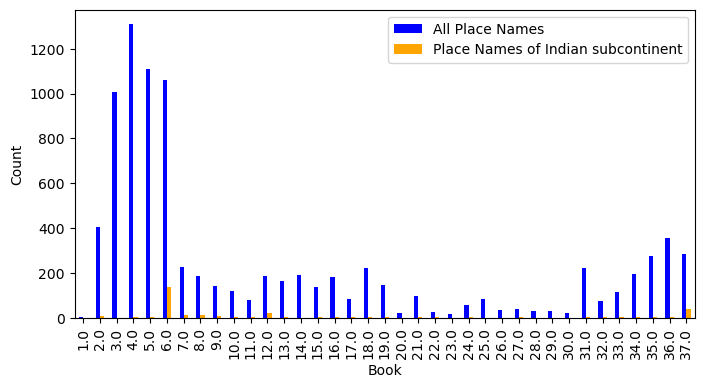

In [16]:
#| label: fig-grouped_place_name_count_comparison
#| fig-cap: Occurence count for all place names and place names of Indian subcontinent in each book

import matplotlib.pyplot as plt

# Compute the grouped count of place names in the current DataFrame
allplacecount = geotext_whole_update.groupby('Book')['Chapter'].count()

# Compute the grouped count of place names in the other DataFrame
indianplacecount = india_update.groupby('Book')['Place_Name'].count()

# Combine the counts into a single DataFrame
combined_counts = pd.concat([allplacecount, indianplacecount], axis=1)
combined_counts.columns = ['All Place Names', 'Place Names of Indian subcontinent']
combined_counts.fillna(0, inplace=True)

fig, ax = plt.subplots(figsize=(8, 4))

# Plot the combined counts as a bar chart with different colors
combined_counts.plot.bar(color=['blue', 'orange'], ax=ax)


# Customize the plot
ax.set_xlabel('Book')
ax.set_ylabel('Count')

# Show the plot
plt.show()


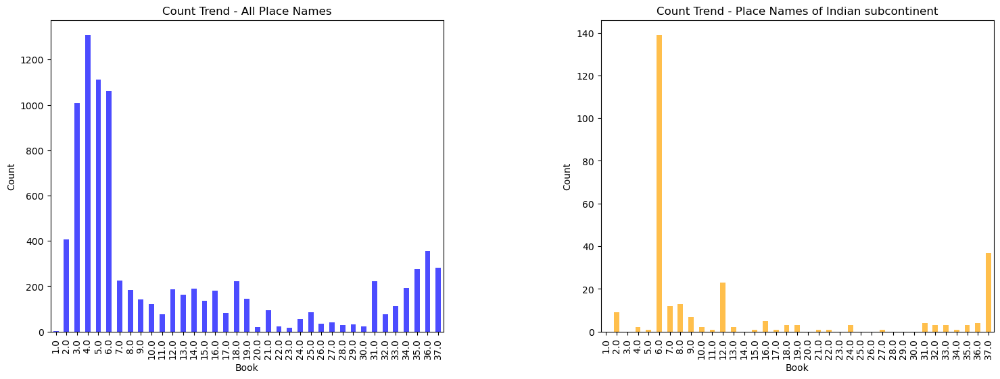

In [130]:
#| label: fig-subplots_place_name_count_comparison
#| fig-cap: Occurence count for all place names and place names of Indian subcontinent in each book_different y-axis scales 

# Set up the figure and axes for the subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

# Plot the bar chart for 'All Place Names' on the first subplot
combined_counts['All Place Names'].plot(kind='bar', ax=ax1, color='blue', alpha=0.7)
ax1.set_xlabel('Book')
ax1.set_ylabel('Count')
ax1.set_title('Count Trend - All Place Names')

# Plot the bar chart for 'Other Place Names' on the second subplot
combined_counts['Place Names of Indian subcontinent'].plot(kind='bar', ax=ax2, color='orange', alpha=0.7)
ax2.set_xlabel('Book')
ax2.set_ylabel('Count')
ax2.set_title('Count Trend - Place Names of Indian subcontinent')

# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.4)

# Show the plot
plt.show()

The figures reveal a distinct difference between the occurrence trends of place names related to the Indian subcontinent and all place names collectively. Specifically, the referencing of the Indian subcontinent is highly concentrated in books 6, 12, and 37 of Pliny's narrative. This discrepancy indicates that the mentioning of place names from the Indian subcontinent is closely tied to specific themes and topics within Pliny's work.

In this regard, three methodologies have been employed to analyze the texts pertaining to the Indian subcontinent in *Natural History*, including word frequency and collocation analysis, topic modeling, and network analysis. The objective of these analyses is to delve deeper into the textual content, unraveling the intricate relationships and uncovering the underlying themes and connections associated with the place names of the Indian subcontinent.

Through word frequency and collocation analysis, the aim is to identify keyword and significant word combinations co-occur in the textual content about India in *Natural History*. This analysis provides insights into the specific linguistic patterns and contextual associations surrounding the Indian places mentioned in the work, providing an overview of the keyword in the discourse.

Topic modeling allows for a broader exploration of the thematic landscape within which the Indian subcontinent place names are embedded. By clustering related words and identifying prevalent topics, this methodology helps to discern the major themes and subject matters that emerge from Pliny's narrative, providing a comprehensive understanding of the broader context in which these place names are mentioned.

Furthermore, network analysis offers a visual representation of the interconnections among the place names of the Indian subcontinent and other entities in Pliny's work. By examining the relationships between different locations and named entities, this analysis uncovers the geographical and conceptual networks that exist within the text, revealing how the Indian subcontinent place names contribute to the overall structure and narrative flow of *Natural History*.

Together, these methodologies aim to provide a nuanced and comprehensive exploration of the texts related to the Indian subcontinent in *Natural History*. By delving into the linguistic, thematic, and network aspects of these place names, a deeper understanding of their role in shaping Pliny's narrative can be achieved.

### Word frequency and collocating bi-grams

By utilizing the measurements available in the [NLTK](https://www.nltk.org/) package, a word frequency list and collocating bi-grams were generated from the text associated with Indian place names in *Natural History*. These outputs provide an overview of the prevalent words and word patterns, as potential keywords in the text.

In the initial observation, the words "India" and "one" ranked high in the frequency list. However, it is apparent that the passages would include the word "India" when discussing about India, making it less informative as a keyword. Likewise, the word "one" appeared as a generic descriptor for bringing up a type of tribe, plant, or attributes like distance, volume, or range, offering limited insight as a keyword. To enhance the relevance and descriptive nature of the frequency list, these two common but less informative words, "India" and "one", are further excluded from the token list.

In [18]:
indiatokenlist = [word for paragraph in tokenize_paragraphs(geotext_india['Text'].drop_duplicates()) for word in paragraph]
indiatokenlist = [token for token in indiatokenlist if token != 'india' and token != 'one']

# apply the freqency distribution function to the token list
freq_dist = nltk.FreqDist(indiatokenlist)

# Sort the words by frequency in descending order
sorted_words = freq_dist.most_common()

# Get the frequency of the 20th word
top_count = sorted_words[188][1]

# Get all words with frequencies greater than or equal to the frequency of the 20th word
top_words = [(word, count) for word, count in sorted_words if count >= top_count]

corpus_size = len(indiatokenlist)
top_freq = len(top_words)
top_freq_ratio = round(top_freq/corpus_size*100)
top_freq_ratio

display(Markdown("""Among {corpus_size} tokens excluding "India" and "one", 
{top_freq} (the top {top_freq_ratio}%) frequently occuring words in the India-related text in *Natural History*
are shown in @fig-freqwords_treemap and @fig-freqwords_wordcloud.""".format(corpus_size = corpus_size, top_freq = top_freq, top_freq_ratio = top_freq_ratio)))

Among 17729 tokens excluding "India" and "one", 
201 (the top 1%) frequently occuring words in the India-related text in *Natural History*
are shown in @fig-freqwords_treemap and @fig-freqwords_wordcloud.

In [21]:
#| output: false
top_words

[('also', 199),
 ('stone', 171),
 ('river', 123),
 ('called', 98),
 ('hundred', 96),
 ('colour', 96),
 ('name', 94),
 ('like', 94),
 ('found', 82),
 ('sea', 80),
 ('island', 79),
 ('people', 76),
 ('even', 76),
 ('city', 70),
 ('mile', 67),
 ('kind', 67),
 ('known', 60),
 ('come', 59),
 ('day', 55),
 ('tree', 55),
 ('two', 54),
 ('made', 52),
 ('indian', 52),
 ('nation', 52),
 ('place', 51),
 ('white', 51),
 ('part', 50),
 ('water', 50),
 ('black', 46),
 ('king', 45),
 ('among', 44),
 ('arabia', 43),
 ('country', 43),
 ('well', 42),
 ('mountain', 42),
 ('time', 41),
 ('elephant', 41),
 ('however', 41),
 ('salt', 41),
 ('gold', 41),
 ('foot', 40),
 ('distance', 40),
 ('used', 40),
 ('variety', 40),
 ('say', 39),
 ('upon', 39),
 ('many', 39),
 ('alexander', 37),
 ('another', 37),
 ('region', 37),
 ('red', 36),
 ('sun', 35),
 ('said', 35),
 ('great', 34),
 ('others', 34),
 ('three', 34),
 ('writer', 34),
 ('first', 34),
 ('make', 32),
 ('animal', 32),
 ('amber', 32),
 ('district', 31),
 (

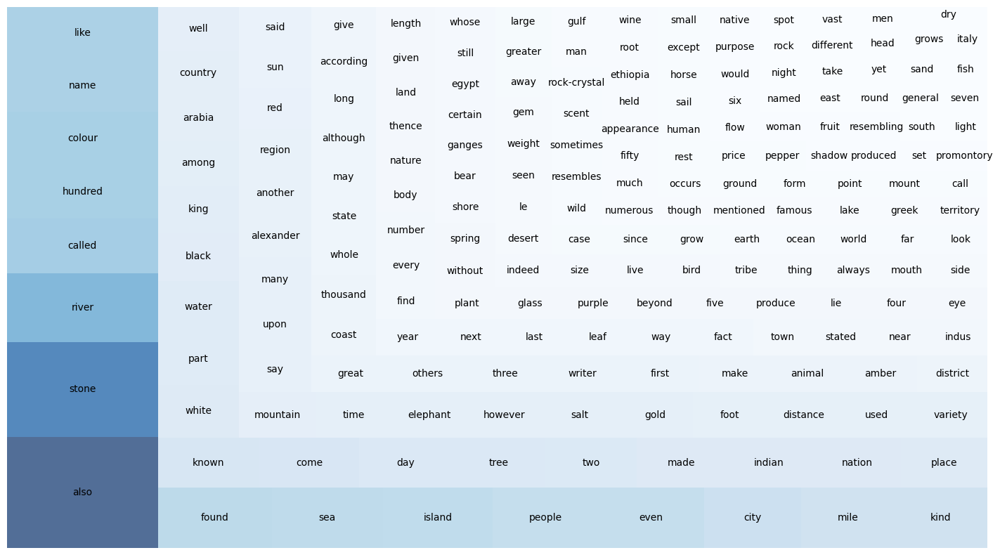

In [19]:
#| label: fig-freqwords_treemap
#| fig-cap: Top 1% frequent words in Indian subcontinent related text as tree map

import squarify
import matplotlib.cm as cm

# top_words contains the list of (word, count) tuples
labels = [word for word, _ in top_words]
sizes = [count for _, count in top_words]

# Normalize the sizes to range between 0 and 1
normalized_sizes = [(size - min(sizes)) / (max(sizes) - min(sizes)) for size in sizes]

# Define the color scale
color_scale = cm.Blues

plt.figure(figsize=(18, 10))
squarify.plot(sizes=sizes, label=labels, alpha=0.7, color=color_scale(normalized_sizes))

# Add labels and title
plt.axis('off')

# Show the treemap
plt.show()

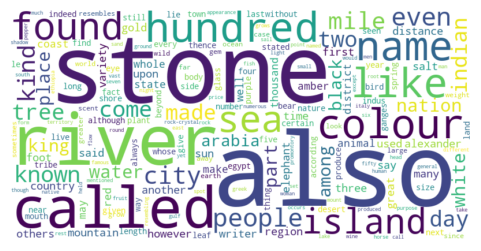

In [20]:
#| label: fig-freqwords_wordcloud
#| fig-cap: Top 1% frequent words in Indian subcontinent related text as word cloud

from wordcloud import WordCloud
# top_words contains the list of (word, count) tuples
wordcloud_data = {word: count for word, count in top_words}

# Create a WordCloud object
wordcloud = WordCloud(width=800, height=400, background_color='white')

# Generate the word cloud from the word frequency data
wordcloud.generate_from_frequencies(wordcloud_data)

# Display the word cloud
plt.figure(figsize=(6, 3))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

# Show the plot
plt.show()

An intriguing observation from the word frequency sorting is the prominence of the word "also" in the given text. The word "also" appears frequently, which can be attributed to the encyclopedic nature of the work, where it is often used to draw comparisons in introductions about species and natural phenomena.

As shown in the following examples where "also" appears in the India-related text in *Natural History*, it is indeed used when comparing the counterparts in India after introducing a natural phenomenon, plant or human activity. In this regard, the common use of "also" may imply that India holds significance as a contrast in the broader narrative. 

>2.75.1 "**Also** in India at the well-known port of Patala the sun rises......"

>12.10.1 "In India there is **also** a thorn the wood of which resembles ebony......"

>12.15.1 "There is **also** in India a grain resembling that of pepper, but larger and more brittle......"

>12.17.1 "Arabia **also** produces cane-sugar, but that grown in India is more esteemed."

The hypothesis is further confirmed towards the end of the work in book 37, where Pliny concludes his comprehensive discourse on "Nature". In 37.77.1, Pliny bestows the highest praise upon Italy, considering it to have earned "Nature's crown". And in this context, when expressing his preference and overall judgment, Pliny makes one final mention of "India". He indicates that, "if we leave aside the fabulous marvels of India"^[*Natural History* 37.77.1 (<a href="https://topostext.org/work/153" target="_blank">https://topostext.org/work/153</a>)], Spain can be appreciated as a significant and attractive destination, second only to Italy. This unintentional highlight of India suggests that it holds considerable importance as a distant contrast to the Mediterranean area, where the focal point locates in the *Natural History*'s world scope.

And following by "also", the words "stone", "river", "called" and "colour" notably stand out in the word frequeny sorting. These frequent occurrences suggest some potential themes related to India in the content of *Natural History*, which aligns with the distribution of Indian place names as depicted in @fig-subplots_place_name_count_comparison. 

Looking into the text in the three books pertaining the most mentions of Indian place names, book 6 includes specific topics on Nations of India, the Ganges and Indus (two main rivers in India) and routes of voyages to India, and book 12 contains introductions to trees and the economic values of their roots and leaves, as well as plants and their medical and flavouring effects. While book 37 focuses on descriptions of different types of gemstones, where the priciple types are introduced in a sequence/category of colours, alongside critics about the luxury trade they represents. 

The frequent use of the word "river" in India-related text may be related to the mention of voyage and trading routes concerning India in *Natural History*. On the other hand, "stone" and "color" clearly connect to the content in book 37, which deals with gemstones.

These two potential themes observed from the frequent occuring words indicate that the geographical location and routes toward Indian subcontinent, and its role as an origin of many plants, animals and gemstones, pocesses a significance in the content about India in *Natural History*. 

In addition to word frequency observation, collocation analysis is utilized to explore the common word patterns within the India-related text in *Natural History*.

In [7]:
from nltk import bigrams

bi_grams = list(bigrams(indiatokenlist))

india_bigram_count = len(bi_grams)
india_bigram_show = round(india_bigram_count*0.001)

display(Markdown("""
The top 0.1% of the most likely collocating bi-grams are extracted using the likelihood ratio measurement.
This selection process yields {india_bigram_show} out of {india_bigram_count} bi-grams that are most significant and likely 
to co-occur together in the target corpus.""".format(india_bigram_count = india_bigram_count, india_bigram_show = india_bigram_show)))



The top 0.1% of the most likely collocating bi-grams are extracted using the likelihood ratio measurement.
This selection process yields 18 out of 17728 bi-grams that are most significant and likely 
to co-occur together in the target corpus.

However, during the initial observation, it was noted that approximately one-third of the extracted bi-grams contained the word "hundred", such as in ('hundred', 'fifty') and ('six', 'hundred'). These bi-grams typically denoted measurements for distance, object length, or quantity, offering limited descriptive information about the content of the text. Consequently, the word "hundred" was excluded from further bi-gram extraction to focus on more informative and relevant co-occuring words.

And the updated output bi-grams are list as follows:

In [21]:
from nltk.collocations import BigramCollocationFinder
from nltk.metrics import BigramAssocMeasures

keywords = ['hundred']

finder = BigramCollocationFinder.from_words(indiatokenlist)

for keyword in keywords:
    finder.apply_word_filter(lambda w: w == keyword.lower())

measures = BigramAssocMeasures()

finder.nbest(measures.likelihood_ratio, 18)

[('alexander', 'great'),
 ('father', 'liber'),
 ('caspian', 'gate'),
 ('fifty', 'mile'),
 ('denarii', 'pound'),
 ('gold', 'silver'),
 ('precious', 'stone'),
 ('river', 'indus'),
 ('fourteen', 'equinoctial'),
 ('olive', 'oil'),
 ('asia', 'minor'),
 ('equinoctial', 'hour'),
 ('lapis', 'lazuli'),
 ('red', 'sea'),
 ('mile', 'breadth'),
 ('emperor', 'nero'),
 ('already', 'mentioned'),
 ('ft.', 'long')]

The extracted bi-grams can be broadly categorized into four types:

**Historical figures**:
('alexander', 'great'), ('father', 'liber'), ('emperor', 'nero')

**Geographical locations and features**:
('caspian', 'gate'), ('river', 'indus'), ('asia', 'minor'), ('red', 'sea')

**Meseuarments (distance, currency, length, time)**:
('fifty', 'mile'), ('denarii', 'pound'), ('fourteen', 'equinoctial'), ('equinoctial', 'hour'), ('mile', 'breadth'), ('ft.', 'long')

**Trading goods**:
('gold', 'silver'), ('precious', 'stone'), ('olive', 'oil'), ('lapis', 'lazuli')

On the one hand, the presence of bi-grams associated with geographical locations, distance, and time measurements in the India-related text reaffirms India's position as a geographic reference, consistent with the earlier findings from the word frequency list and literature review. On the other hand, within the context of the Indo-Mediterranean network of exchange, the occurrence of bi-grams related to geographical locations, currency measurements, and trading goods underscores the importance of India's role in merchandise trade within the narratives of *Natural History*.

Furthermore, the occurrence of historical figures such as "Alexander III, the Great (king of Macedon)", "Nero (Roman emperor)", and "Father Liber (referring to Dionysus, the Greek god of winemaking and wine)" suggests their connections with India in the history of expeditions or mythical tales (Dionysus is believed to have conquered India in Greek epic). This observation opens up a perspective for clustering the human names mentioned in the text to reveal the content structure about India in *Natural History*, which will be further explored in the Network Analysis section.

In conclusion, the analysis of word frequency and collocation in the India-related text within *Natural History* reveals noteworthy word patterns. These patterns suggest that India holds a significant role as a geographical contrast, being compared in terms of distance, natural phenomena, and origin of products with other regions introduced in the narrative. Furthermore, it is highlighted for its prominent role in merchandise trade in the portrait of India in *Natural History*.

### Topic modeling

Furthermore, topic modeling approach is applied to delve further into the underlying topics about India in the work. Topic modeling is a widely used method for text analysis that infers the latent topics in a collection of documents[@bail; @underwood2012]. Latent Dirichlet Allocation (LDA), as its most commonly employed algorithm, operates under an assumption that each document contains a mixture of different topics, and each topic is defined as a collection of words with varying probabilities of appearance in the passages[@underwood2012;@kapadia2022].

In this study, the collection of India-related text in *Natural History*, segmented into paragraphs, are considered as different "documents". And the [Genism](https://radimrehurek.com/gensim/) library in Python is utilized for semantic vectorization and the implementation of the LDA model on the groups of words within the text^[The code for LDA implementation was referred to the tutorial of @barber].

Since the corpus size for text pertaining to Indian place names is relatively small, after several attempts with a consideration of the coherence score distribution depicted in @fig-topic_coherence_distribution, the number of topics is determined to be 3, with 40 passes to obtain the most optimal and non-overlapping topic clusters.

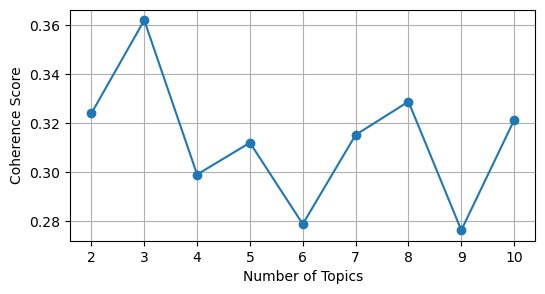

In [75]:
#| label: fig-topic_coherence_distribution
#| fig-cap: Conherence distribution of different topic numbers when passes=40

topic_range = range(2, 11)

# Initialize lists to store coherence scores
coherence_scores = []

# Tokenize and create the corpus and dictionary
indiapara = tokenize_paragraphs(geotext_india['Text'].drop_duplicates())
#indiapara = [[word for word in paragraph if word != 'india'] for paragraph in indiapara]
indiadictionary = corpora.Dictionary(indiapara)
indiacorpus = [indiadictionary.doc2bow(text) for text in indiapara]

# Calculate coherence scores for different topic numbers
for num_topics in topic_range:
    indialdamodel = gensim.models.ldamodel.LdaModel(
        indiacorpus, num_topics=num_topics, id2word=indiadictionary, passes=40
    )
    coherence_model = CoherenceModel(
        model=indialdamodel, texts=indiapara, dictionary=indiadictionary, coherence='c_v'
    )
    coherence_scores.append(coherence_model.get_coherence())

# Plot the coherence scores against the number of topics
plt.figure(figsize=(6, 3))
plt.plot(topic_range, coherence_scores, marker='o')
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.xticks(topic_range)
plt.grid(True)
plt.show()

And the list of 30 keywords, grouped by the 3 assigned topics, is presented below.

In [27]:
## topic modeling about texts related to "India"

## import the necessary modules

indialdamodel = gensim.models.ldamodel.LdaModel(indiacorpus, num_topics=3, id2word = indiadictionary, passes=40)

from pprint import pprint
pprint(indialdamodel.print_topics(num_topics=3, num_words=30))

[(0,
  '0.014*"stone" + 0.011*"also" + 0.007*"colour" + 0.007*"india" + '
  '0.007*"found" + 0.006*"like" + 0.004*"one" + 0.004*"black" + 0.004*"tree" + '
  '0.004*"amber" + 0.004*"name" + 0.003*"known" + 0.003*"white" + 0.003*"kind" '
  '+ 0.003*"gold" + 0.003*"made" + 0.003*"even" + 0.003*"called" + '
  '0.003*"indian" + 0.003*"glass" + 0.002*"part" + 0.002*"people" + '
  '0.002*"used" + 0.002*"variety" + 0.002*"many" + 0.002*"river" + '
  '0.002*"make" + 0.002*"rock-crystal" + 0.002*"island" + 0.002*"red"'),
 (1,
  '0.009*"stone" + 0.008*"also" + 0.007*"india" + 0.006*"like" + 0.006*"kind" '
  '+ 0.006*"colour" + 0.005*"name" + 0.005*"one" + 0.004*"called" + '
  '0.004*"even" + 0.004*"white" + 0.003*"pepper" + 0.003*"variety" + '
  '0.003*"another" + 0.003*"known" + 0.003*"tree" + 0.003*"black" + '
  '0.003*"weight" + 0.003*"leaf" + 0.003*"purple" + 0.002*"grain" + '
  '0.002*"people" + 0.002*"denarii" + 0.002*"used" + 0.002*"nard" + '
  '0.002*"resembles" + 0.002*"pound" + 0.002*"t

In [17]:
#| output: false

coherence_model = CoherenceModel(model=indialdamodel, texts=indiapara, dictionary=indiadictionary, coherence='c_v')
coherence_score = coherence_model.get_coherence()

print("Coherence Score:", coherence_score)

Coherence Score: 0.3756133994728454


Based on the prominent categories of the keywords and the possible interconnection within each group, a interpretation of the topic emerged from each keyword clusters can be drawn as follows.

**Group 0**: This group consists of keywords related to precious stones, such as "stone", "amber", "rock-crystal"and "glass", with colour references like "black", "white", and "red". Therefore, the underlying topic appears to be the description of precious stones.

**Group 1**: This group comprises various natural products, such as "tree", "leaf", "pepper","grain" and "nard", along with descriptive words like "weight", "pound" and "taste". In addition, the ancient Roman currency "denarii" appears in the group, suggesting a possible topic related to merchandise trade with Indian subcontinent.

**Group 2**: This group contains different geographical features, such as "river", "island", "sea" and "mountain". It also includes terms related to cities, nations, kings, and distances, and the name "Alexander", referring to Alexander the Great, who has undertook an expedition to Indian subcontinent. "Elephant", as an important property of the King in India during Pliny's era, also represents the power and size of the Indian kingdoms. In this regard, the underlying topic for this group likely pertains to geography and society in India.

The interactive visualisation of the 3 topic clusters, manifesting the intertopic distance map and the most salient/relevant terms within the given textand their contributing weights for each topic, can be accessed on the html version of this [thesis](https://raw.githack.com/lizaodawn/NH_thesis/main/NHthesis_structure.html).

The static demonstration of the visualisation can be referred in @fig-topic_cluster0, @fig-topic_cluster1, @fig-topic_cluster2 and @fig-topic_cluster3.

The intertopic distance map is shown on the left panel of the interactive chart. Each bubble represents a topic, and the size of the bubble indicates the percentage of the texts in the corpus contributing to the topic. The distance between the bubbles implies the extent of difference between them. And a good topic model is expected to have big and non-overlapping bubbles scattered throughout the chart [@tran2022].  

And the most salient/relevant keyword is shown on the right panel. The blue bars represent the overall frequency of each word in the corpus. If no topic is selected, the blue bars of the most frequently used words will be displayed. The contribution of the frequent word to each topic will be shown in size difference when hovering. And when hovering on the bubbles in the left panel, there will be red bars in the right panel giving the estimated number of times a given term was generated by a given topic. The word with the longest red bar is estimated to be used the most in the texts belonging to that topic. 

In [38]:
import pyLDAvis
import pyLDAvis.gensim_models

# Convert the LdaModel object to a pyLDAvis-compatible format
vis_dataindia = pyLDAvis.gensim_models.prepare(indialdamodel, indiacorpus, indiadictionary, R=30, sort_topics=False)

# Enable the Jupyter notebook inline display of visualizations
pyLDAvis.enable_notebook()

# Display the pyLDAvis visualization
pyLDAvis.display(vis_dataindia)

C:\Users\dawn\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
C:\Users\dawn\anaconda3\lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


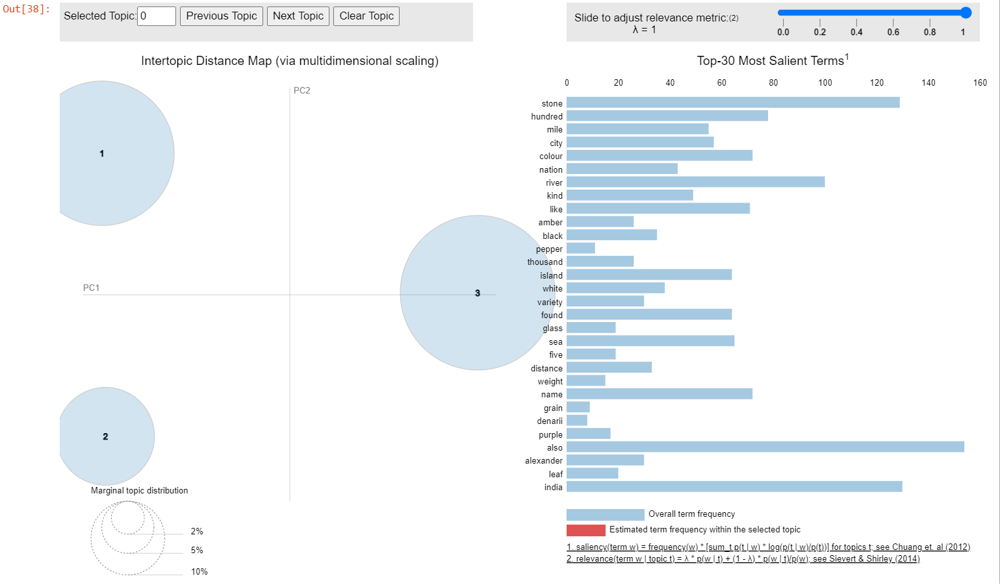

In [39]:
#| label: fig-topic_cluster0
#| fig-cap: Topic cluster (overall) 

Image(filename='topicmodeling00_pdf.png')

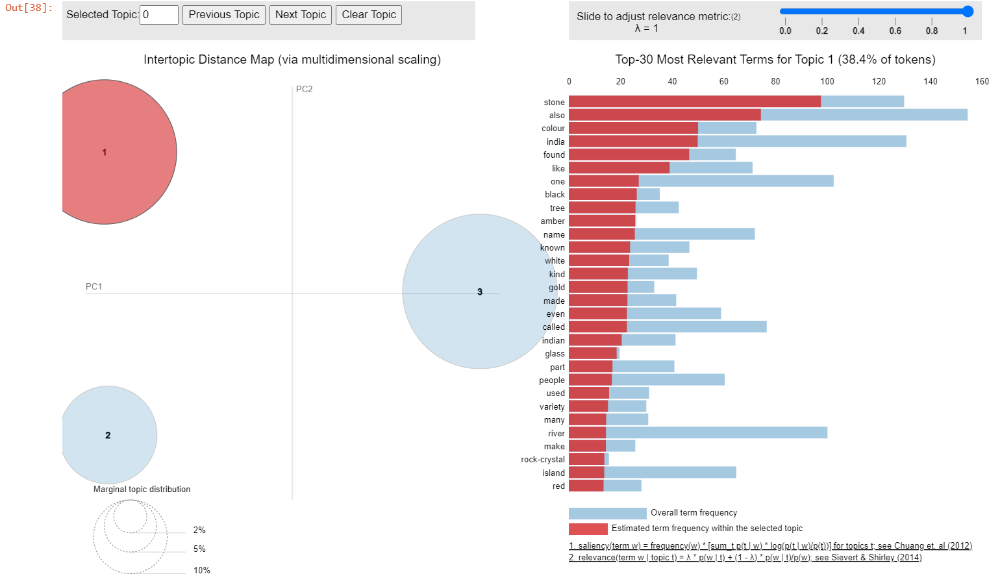

In [40]:
#| label: fig-topic_cluster1
#| fig-cap: Topic cluster (highlighting on Topic_0)

Image(filename='topicmodeling01_pdf.png')

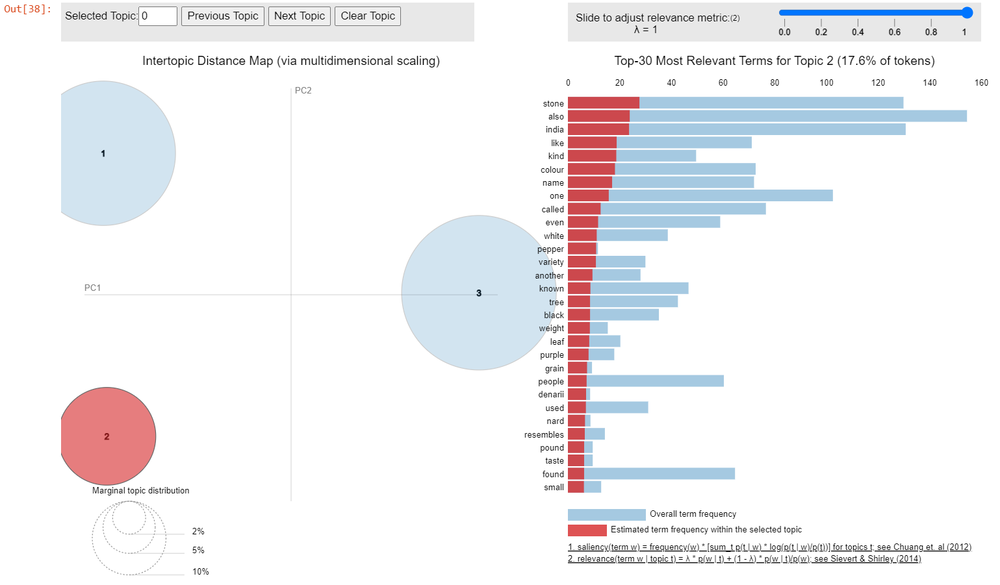

In [41]:
#| label: fig-topic_cluster2
#| fig-cap: Topic cluster (highlighting on Topic_1)

Image(filename='topicmodeling02_pdf.png')

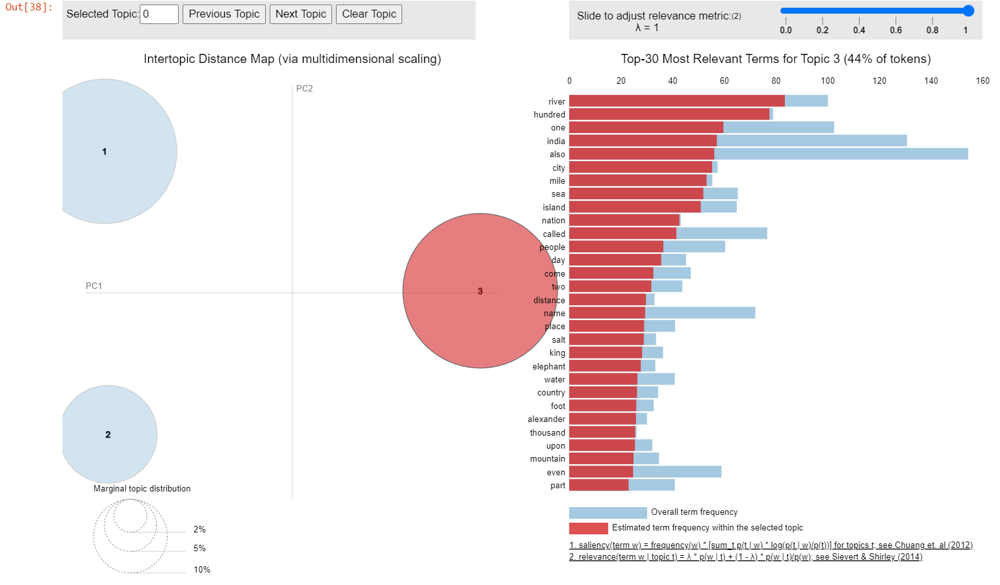

In [42]:
#| label: fig-topic_cluster3
#| fig-cap: Topic cluster (highlighting on Topic_2)

Image(filename='topicmodeling03_pdf.png')

In the above visualisation, the three keyword clusters are distanced from each other, indicating that they formed distinct potential topics within the given text. And the first (about stones) and the last (about Indian geography and society) topics took up a more significatnt portion comparing to the second topic (about merchandise trade).

Additionally, the specific context of the Indian places mentioned in *Natural History* is manually summarized and categorized into broader types to serve as a comparison and extension to the topics generated by the model. The innitial comments about the context were drawn upon a close reading of the related text, with consideration of the book and chapter theme indicated in the text. The comments and summary are stored in CSV format and imported as pandas data frame. 

In [22]:
#| output: false

india_close_context = pd.read_csv('india_corpus_close_reading.csv')
india_close_context['Context summary'] = india_close_context['Context summary'].str.split('; ')
india_close_context = india_close_context.explode('Context summary')

mapping = {
    'goods/animals/plants origin': 'goods/animals/plants origin',
    'geographical reference': 'geographical reference',
    'focused introduction': 'general introduction',
    'origin of high quality goods': 'prominent features',
    'origin of the large sized objects': 'prominent features',
    'passing mention': 'passing mention',
    'human activities relating to plants/animals': 'producing activity',
    'criticism of luxury goods trade': 'criticism',
    'conquest history': 'conquest history',
    'transportation': 'general introduction',
    'marvels in India': 'prominent features',
    'criticism of human greed': 'criticism',
    'criticism of interference with nature': 'criticism',
    'product/knowledge exchange': 'product/knowledge exchange',
    'goods producing activity': 'producing activity'
}

india_close_context['Context type'] = india_close_context['Context summary'].map(mapping)

india_close_context.iloc[:, :-2].join(india_close_context.iloc[:, -1]).head()

,Book,Chapter,Paragraph,Comment,Context summary,Context type
0,2,75,1,"astronomy, mentioning how the sun motivation i...",geographical reference,geographical reference
1,2,98,1,"description of mountain, mentioning Indus river",geographical reference,geographical reference
2,2,112,1,"description of scope of the world, mentioning ...",geographical reference,geographical reference
3,4,17,4,"topic on Macedonia, metioning it once conquere...",conquest history,conquest history
4,4,26,2,"description of habitants, mentioned a river in...",geographical reference,geographical reference


In [87]:
context_type = india_close_context['Context type'].unique().tolist()

display(Markdown("""
And the summarized comments were further categorized into seven types, namely {context_type}.
""".format(context_type = context_type)))


And the summarized comments were further categorized into seven types, namely ['geographical reference', 'conquest history', 'passing mention', 'general introduction', 'criticism', 'prominent features', 'goods/animals/plants origin', 'producing activity', 'product/knowledge exchange'].


**Geographical reference**: refers to the occurence of Indian place names as geographical reference in the narrative, for example:

> 2.112.1 "...from the river **Ganges** and its mouth where it flows into the Eastern Ocean, through **India** and Parthyene to the Syrian city of Myriandrus situated on the Issic gulf 5,215..."

**Passing mention**: refers to the condition that the names of Indian place included as a side note, for example:

> 5.11.1 "...Coptos, which from its proximity to the Nile, forms its nearest emporium for the merchandise of **India** and Arabia..."

**Conquest history**: refers to the mentions of Indian place names in the context of recalling the conquest history of Alexader the Great, for example:

> 8.61.2 "...When Alexander the Great was on his way to **India**, the king of Albania had presented him with one dog of unusually large size..."

**General introduction**: refers to the focused introduction about the general situation of places in Indian subcontinent, including transportation in the work, it is normally directly indicated at the begining of the affiliated chapter. For example, the whole chapter 21 of book 6 has a leading topic as "The nations of India", the whole chapter 22 of book 6 has a leading topic as "The Ganges".

**Prominent features**: in *Natural History*, the plants and animals from India are often noted for their large size, and Pliny often highlight the good quality of Indian products in his discussion, these genre of context is categorize as "prominent features" of India. For example:

>8.14.1 "...Megasthenes writes that in **India** snakes grow so large as to be able to swallow stags and bulls whole..."
>37.21.1 "...**India**, likewise, is the sole producer of these stones and combining, as they do, the brilliant qualities of the most valuable gems, they above all others description..."

**Goods/animals/plants origin**: there are also many descriptions about India as the origin of different goods, animals and plants, this genre refers to those without concrete comments on their size or quality, just simply mentioned the object is originated in India, for example:

>8.25.2 "Hyrcania and **India** produce the tiger, au animal of terrific speed..."

**Producing activity**: this genre refer to the cases that introduces about the human activity or specific producing process about natural creatures or trading products, such as:

>8.8.1 "The method of capturing them in **India** is for a mahout riding one of the domesticated elephants..."
>37.20.1 "...The **Indians** have found a way of counterfeiting various precious stones, and beryls in particulars by staining rock-crystal."

**Criticism**: woven in the description about merchandise trade with Indian subcontinent, Pliny had drwan direct criticism about the human greed and unnecessary interference on nature it represents, hence these narratives are specificly grouped together, for example:

>12.14.2 "To think that its only pleasing quality is pungency and that we go all the way to India to get this! Who was the first person who was willing to try it on his viands, or in his greed for an appetite was not content merely to be hungry?"

>22.56.1 "I myself shall not touch upon drugs imported from India and Arabia or from the outer world. Ingredients that grow so far away are unsatisfactory for remedies...Let them be bought if you like to make perfumes, unguents and luxuries, or even in the name of religion, for we worship the gods with frankincense and costmary. But health I shall prove to be independent of such drugs, if only to make luxury all the more ashamed of itself."

>33.2.1 "It came to be deemed the proof of wealth, the true glory of luxury, to possess something that might be absolutely destroyed in a moment. Nor was this enough: we drink out of a crowd of precious stones, and set our cups with emeralds, we take delight in holding India for the purpose of tippling, and gold is now a mere accessory."

**Product/knowledge exchange**: in some circumstances, Pliny also mentioned about the knowledge and product exchange during the trade, such as:

>34.48.3 "India possesses neither copper nor lead, and procures them in exchange for her precious stones and pearls."

>37.23.2 "...Indeed, as is generally known, in India the stone is exposed to view by the mountain streams...Later we persuaded the Indians to share our appreciation of it."

And the distribution of context type concluded from close reading is shown in @fig-book_context_distribution and @fig-context_type_freq.

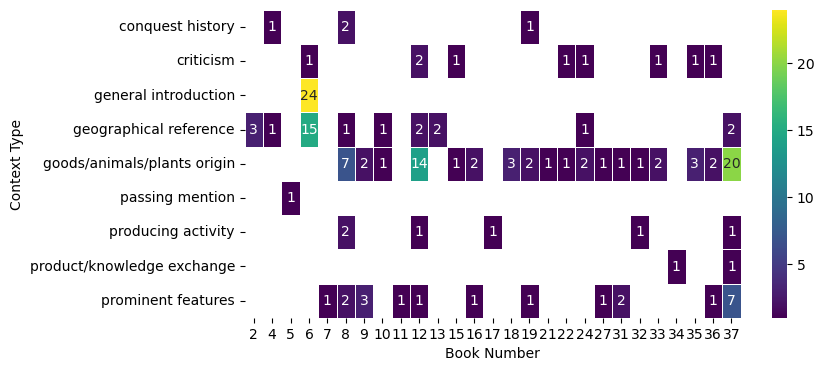

In [24]:
#| label: fig-book_context_distribution
#| fig-cap: Context type distribution in books containing Indian place names

import seaborn as sns

grouped_data = india_close_context.groupby(['Book', 'Context type']).size().reset_index(name='Count')

# Pivot the grouped_data to create the heatmap matrix
heatmap_data = grouped_data.pivot(index='Context type', columns='Book', values='Count')

# Create the heatmap using seaborn
plt.figure(figsize=(8, 4))
sns.heatmap(heatmap_data, cmap='viridis', annot=True, linewidths=0.5, cbar=True)

# Set labels and title
plt.xlabel('Book Number')
plt.ylabel('Context Type')

# Show the plot
plt.show()

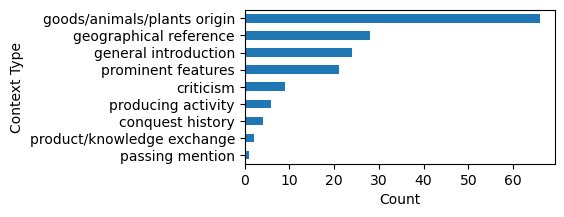

In [25]:
#| label: fig-context_type_freq
#| fig-cap: Occurence frequency of different context type in India-related text 

context_rank = india_close_context['Context type'].value_counts(ascending = True)

plt.figure(figsize=(4, 2))
context_rank.plot(kind='barh')
plt.xlabel('Count')
plt.ylabel('Context Type')
plt.show()

In general, the contexts concluded from the close reading can relate to the latent topics generated from the distant reading method and added more details to the keywords clusters. That is, if we understand the content about India in *Natural History* in three main topics, namely stons, trade, and contrasting nation, under the "stone" topic, except for describing the colour and texture of different types of gemstone, there also include the description about India as an origin of gemstones in a high quality. And under the large proportion of  Indian places as geographical reference and focused introduction mentioned in the narrative, contributes to the formation of "nation" condition as a major topic. Additionally, there were conquest history of the Roman Empire to Indian subcontinent referred in the description. And for the topic about "trade", though it seem inferior to the previous two in terms of quantity, but it is this part that reflects more sentimental judgement from Pliny out of his stoicism standpoint that worshiping nature as a devine and against luxurious desire [@beagon1996].

On top of the observation from the previous section, that India is seen as an important geographical contrast, as well as a significant trading partner in the narrative, a more nuanced protrait of India, linking the conquest story/history of the Roman Empire and criticism aobut human greed from the stoicism with abundant natural wonders and products of the best quality in the world can be drawn from the comprehension of topic modelling and close reading. 

### Network analysis for Named Entity

In addition to the previous methods partly answered on the question about "how India is described?" in *Natural History*, a network analysis of the named entities in the text may shed a light on the structure of the India-related content in the work. As inspired by the person name collocations observed from the collocation analysis, the initial idea for this section is to extract person names mentioned in the India-related text, and generate a entity cluster for the person names, place names, and book number, to explore how the content is structured in the context.

Employing the dataset with supplemented Indian place name annotations, distinct place names (including annotated places outside Indian subcontinenet), person names and book numbers are considered as nodes, and the co-occurences of person name and place names, as well as that of two different place names in the same paragraph, and the book number the person and place name occured, are counted as edges. 

To identify the the impact of different entities in the discourse, the betweeness centrality of the nodes are mesured and represented by the size of the node. And the weight of edge between two nodes represents the time the two entities appeared in the same context. Gone through a Force Atlas 2 layout algorithm, the graph also demonstrates the rough cluster of entities which tend to be mentioned together.

In [28]:
india_file_ids = india_update['FILE_ID'].unique()
india_update_withtext = geotext_whole_update[geotext_whole_update['FILE_ID'].isin(india_file_ids)]

wholebook['FILE_ID'] = wholebook['Reference'].str.extract(r'(\d+\.\d+\.\d+)')
wholebook.set_index('FILE_ID', inplace=True)
wholebook.reset_index(inplace=True)

india_update_withtext = india_update_withtext.merge(wholebook[['FILE_ID', 'Text']], on='FILE_ID', how='left')

In [29]:
india_nw = len(india_update_withtext)

display(Markdown("""Indexing with the book-chapter-paragraph number of the India-related text, 
the place names outside Indian subcontinent mentioned in the same paragraph are also included for the network analysis.
And according to the original TOPOSText and supplemented place name annotations,
there are total of {india_nw} occurences of place names in paragraphs of Indian-related text in *Natural History*.
""".format(india_nw = india_nw)))

Indexing with the book-chapter-paragraph number of the India-related text, 
the place names outside Indian subcontinent mentioned in the same paragraph are also included for the network analysis.
And according to the original TOPOSText and supplemented place name annotations,
there are total of 908 occurences of place names in paragraphs of Indian-related text in *Natural History*.


#### Person name annotation/tag retrieve

In order to extract the people names within the captioned text, approaches of retriving from the TOPOSText annotation and from the tagging of text given by the pretrained multilingual named entity recognition model [WikiNEuRal](https://huggingface.co/Babelscape/wikineural-multilingual-ner) [@tedeschi2021] and [Flair](https://huggingface.co/flair/ner-english-ontonotes-fast) [@akbik2018coling] are compared for adopting the most completed output.

**1. Annotation retrieving from TOPOSText**

On TOPOSText, other than place names, a list of proper names (including people, gods, festivals, animals and artworks) are also annotated to the text of the classics. Each proper name has a unique URI as identifier in the html structure, such as: 
**\<a href="/people/54" target="_blank">Muses\</a>**. 

Utilizing the tools of [Beautiful Soup](https://www.crummy.com/software/BeautifulSoup/bs4/doc/), the textual proper names, their URIs along with the book-chapter-paragraph number they occured in, can be retrieved with the URLs of both parts of *Natural History* on TOPOSText.

In [18]:
#| output: false

# check the format of annotation on TOPOSText with tag as "people"
def people_annotation_extract(url):
    response = requests.get(url)
    soup = BeautifulSoup(response.content, features="lxml")
    links = soup.find_all("a", href=lambda href: href and href.startswith("/people/"))
    return links
people_annotation_extract(url1)[:10]

[<a href="/people/54" target="_blank">Muses</a>,
 <a href="/people/1881" target="_blank">Catullus</a>,
 <a href="/people/2300" target="_blank">Cicero</a>,
 <a href="/people/2300" target="_blank">Cicero</a>,
 <a href="/people/382" target="_blank">Manius</a>,
 <a href="/people/1515" target="_blank">Persius</a>,
 <a href="/people/17495" target="_blank">Junius Congus</a>,
 <a href="/people/15495" target="_blank">Lucilius</a>,
 <a href="/people/2300" target="_blank">Cicero</a>,
 <a href="/people/14983" target="_blank">Cato</a>]

In [38]:
#| output: false
# function for retrieving all annotations with "people" tag

def people_annotation_extract(url):
    response = requests.get(url)
    soup = BeautifulSoup(response.content, features="lxml")
    links = soup.find_all("a", href=lambda href: href and href.startswith("/people/"))

    person_names = []
    topos_text_ids = []
    references = []

    for link in links:
        person_name = link.text.strip()
        topos_text_id = link["href"]  # ToposText ID
        parent = link.find_parent("p")
        reference = parent.get("id")

        person_names.append(person_name)
        topos_text_ids.append(topos_text_id)
        references.append(reference)

    # Create a DataFrame from the extracted information
    df = pd.DataFrame({
        'Person_name': person_names,
        'ToposText_ID': topos_text_ids,
        'Reference': references
    })

    return df

peopledf1 = people_annotation_extract(url1)
peopledf2 = people_annotation_extract(url2)
people_annotation = pd.concat([peopledf1, peopledf2], ignore_index=True)
people_annotation.head()

,Person_name,ToposText_ID,Reference
0,Muses,/people/54,urn:cts:latinLit:phi0978.phi001:1.1.1
1,Catullus,/people/1881,urn:cts:latinLit:phi0978.phi001:1.1.1
2,Cicero,/people/2300,urn:cts:latinLit:phi0978.phi001:1.2.1
3,Cicero,/people/2300,urn:cts:latinLit:phi0978.phi001:1.2.1
4,Manius,/people/382,urn:cts:latinLit:phi0978.phi001:1.2.1


In [35]:
#| echo: false

ppl_book1 = len(peopledf1)
ppl_book2 = len(peopledf2)
ppl_whole = len(people_annotation)

display(Markdown("""In the annotated text of *Natural History* on TOPOSText, 
there are {ppl_book1} such proper name annotations in book 1-11 and {ppl_book2} in book 12-37, 
adding up to a combined total of {ppl_whole} throughout the work."""
.format(ppl_book1 = ppl_book1, ppl_book2 = ppl_book2, ppl_whole = ppl_whole)))

In the annotated text of *Natural History* on TOPOSText, 
there are 5109 such proper name annotations in book 1-11 and 7038 in book 12-37, 
adding up to a combined total of 12147 throughout the work.

The specific annotation type as "person name" can be further validated with the [api](https://topostext.org/api/people/readweb.php) on TOPOText. In the api file, all the entities of people/gods, has been valued as "male" or "female" as its "gender" key. Based on this criteria, those with other values in their "gender" key, such as "gender":"animal" or "gender":"other", are not considered as "people" and filtered out from the retrieved output. Moreover, as there is a "concat" value indicating a detailed name of the signified person and shared with all variants of the same URI, the "concat" value is also fetched as a more accurate information of person name enetity.

In [39]:
#| output: false

def people_validate(json_data, target_id):
    for item in json_data['records']:
        if item['ID'] == target_id:
            if item.get('gender') in ['male', 'female']:
                return item.get('concat')
            else:
                return False

api_url = f"https://topostext.org/api/people/readweb.php"
response = requests.get(api_url)
data = response.json()
people_annotation['Person_name_concat'] = people_annotation.apply(lambda row: people_validate(data, str(row['ToposText_ID'].split('/')[-1])), axis=1)
people_annotation

,Person_name,ToposText_ID,Reference,Person_name_concat
0,Muses,/people/54,urn:cts:latinLit:phi0978.phi001:1.1.1,Muses (goddesses)
1,Catullus,/people/1881,urn:cts:latinLit:phi0978.phi001:1.1.1,Catullus
2,Cicero,/people/2300,urn:cts:latinLit:phi0978.phi001:1.2.1,Marcus Tullius Cicero
3,Cicero,/people/2300,urn:cts:latinLit:phi0978.phi001:1.2.1,Marcus Tullius Cicero
4,Manius,/people/382,urn:cts:latinLit:phi0978.phi001:1.2.1,Manius
...,...,...,...,...
12142,horses,/people/10959,urn:cts:latinLit:phi0978.phi001:37.74.1,False
12143,cattle,/people/10978,urn:cts:latinLit:phi0978.phi001:37.77.1,False
12144,horses,/people/10959,urn:cts:latinLit:phi0978.phi001:37.77.1,False
12145,Arabian,/people/275,urn:cts:latinLit:phi0978.phi001:37.78.1,False


In [40]:
#| label: tbl-validated_people_anno
#| tbl-cap: Example of retrieved and validated person name annotations in *Naturl History*

validated_people = people_annotation.loc[people_annotation['Person_name_concat']!=False]
validated_people['FILE_ID'] = validated_people['Reference'].str.extract(r'(\d+\.\d+\.\d+)')
validated_people.set_index('FILE_ID', inplace=True)
validated_people.reset_index(inplace=True)
validated_people.head()

C:\Users\dawn\AppData\Local\Temp\ipykernel_6300\1414779911.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  validated_people['FILE_ID'] = validated_people['Reference'].str.extract(r'(\d+\.\d+\.\d+)')


,FILE_ID,Person_name,ToposText_ID,Reference,Person_name_concat
0,1.1.1,Muses,/people/54,urn:cts:latinLit:phi0978.phi001:1.1.1,Muses (goddesses)
1,1.1.1,Catullus,/people/1881,urn:cts:latinLit:phi0978.phi001:1.1.1,Catullus
2,1.2.1,Cicero,/people/2300,urn:cts:latinLit:phi0978.phi001:1.2.1,Marcus Tullius Cicero
3,1.2.1,Cicero,/people/2300,urn:cts:latinLit:phi0978.phi001:1.2.1,Marcus Tullius Cicero
4,1.2.1,Manius,/people/382,urn:cts:latinLit:phi0978.phi001:1.2.1,Manius


In [91]:
ppl_validate = len(validated_people)
india_ppl_validate = validated_people['FILE_ID'].isin(india_update_withtext['FILE_ID']).sum()

display(Markdown("""An example of the data structure of the retrieved output of person name annotations in *Natural History*
is shown in @tbl-validated_people_anno. 
There are total {ppl_validate} occurences of person names annotated in the whole work, **{india_ppl_validate}** of which 
are within the India-related text."""
.format(ppl_validate = ppl_validate, india_ppl_validate = india_ppl_validate)))

An example of the data structure of the retrieved output of person name annotations in *Natural History*
is shown in @tbl-validated_people_anno. 
There are total 6568 occurences of person names annotated in the whole work, **330** of which 
are within the India-related text.

In [47]:
#| output: false
validated_people.loc[validated_people['FILE_ID'].isin(india_update_withtext['FILE_ID'])]

,FILE_ID,Person_name,ToposText_ID,Reference,Person_name_concat
223,2.75.1,Onesicritus,/people/936,urn:cts:latinLit:phi0978.phi001:2.75.1,Onesicritus
224,2.75.1,Alexander,/people/6,urn:cts:latinLit:phi0978.phi001:2.75.1,"Alexander III, the Great (general)"
225,2.75.1,Alexander,/people/6,urn:cts:latinLit:phi0978.phi001:2.75.1,"Alexander III, the Great (general)"
226,2.75.1,Onesicritus,/people/936,urn:cts:latinLit:phi0978.phi001:2.75.1,Onesicritus
283,2.112.1,Hercules,/people/4,urn:cts:latinLit:phi0978.phi001:2.112.1,"Heracles (s. of Zeus), Hercules"
...,...,...,...,...,...
6554,37.63.1,Memnon,/people/1491,urn:cts:latinLit:phi0978.phi001:37.63.1,Memnon (s. of Tithonus)
6555,37.63.1,Alexander,/people/13,urn:cts:latinLit:phi0978.phi001:37.63.1,Alexander (misc)
6556,37.63.1,Xenocrates,/people/15164,urn:cts:latinLit:phi0978.phi001:37.63.1,Xenocrates of Aphrodisias
6563,37.70.1,Democritus,/people/139,urn:cts:latinLit:phi0978.phi001:37.70.1,Democritus (philosopher)


In [79]:
#| label: tbl-person_anno_merged
#| tbl-cap: Example for person name annotation merged into India-related text dataset

india_update_addpeople_anno = pd.merge(india_update_withtext, validated_people[['FILE_ID', 'Person_name_concat']], on='FILE_ID', how='left')
india_update_addpeople_anno.dropna(subset=['Person_name_concat'], inplace=True)
india_update_addpeople_anno[['FILE_ID', 'Place_Name', 'Book', 'Text', 'Person_name_concat']].head()

,FILE_ID,Place_Name,Book,Text,Person_name_concat
0,2.75.1,Syene,2.0,Similarly it is reported that at the town of S...,Onesicritus
1,2.75.1,Syene,2.0,Similarly it is reported that at the town of S...,"Alexander III, the Great (general)"
2,2.75.1,Syene,2.0,Similarly it is reported that at the town of S...,"Alexander III, the Great (general)"
3,2.75.1,Syene,2.0,Similarly it is reported that at the town of S...,Onesicritus
4,2.75.1,India,2.0,Similarly it is reported that at the town of S...,Onesicritus


In [92]:
ppl_anno_merged = len(india_update_addpeople_anno)

display(Markdown("""As shown in @tbl-person_anno_merged, the validated annotated person names are added to 
the India-related text dataset. With the person name annotation retrieving, there found total **{ppl_anno_merged}** 
co-occurences of single place name and person name in the same paragraph 
within the India-related text in *Natural History*."""
.format(ppl_anno_merged = ppl_anno_merged)))

As shown in @tbl-person_anno_merged, the validated annotated person names are added to 
the India-related text dataset. With the person name annotation retrieving, there found total **3583** 
co-occurences of single place name and person name in the same paragraph 
within the India-related text in *Natural History*.

**2. Named entity recognition with [WikiNEuRal](https://huggingface.co/Babelscape/wikineural-multilingual-ner)**

To evaluate the quality and completeness of the extracted person name annotations, two widely practiced pretrained machine learning models for named entity recognition, [WikiNEuRal](https://huggingface.co/Babelscape/wikineural-multilingual-ner) [@tedeschi2021] and [Flair](https://huggingface.co/flair/ner-english-ontonotes-fast) [@akbik2018coling] are utilized for tagging person names in the India-related text.

In [83]:
#| output: false

india_text = india_update_withtext.drop_duplicates(subset=['FILE_ID'], keep='first')
# Extract the DataFrame with only 'FILE_ID' and 'Text' columns
india_text =india_text.loc[:, ['FILE_ID', 'Text']]
india_text

,FILE_ID,Text
0,2.75.1,Similarly it is reported that at the town of S...
10,2.98.1,Near the town of Harpasa in Asia stands a jagg...
21,2.112.1,"Our own portion of the earth, which is my subj..."
66,4.17.4,"Such is Macedonia, which was once the mistress..."
77,4.26.2,"At this spot begins a well-wooded district, wh..."
...,...,...
835,37.63.1,"No description of the 'Memnonia,' or 'stone of..."
841,37.65.1,The stone that bears the foreign name 'oica' i...
844,37.70.1,"The 'zathenes,' according to Democritus, is an..."
847,37.76.1,"I, on the other hand, am prepared to explain t..."


In [67]:
#| echo: false

#set pipeline for the NER model

from transformers import AutoTokenizer, AutoModelForTokenClassification
from transformers import pipeline

tokenizer = AutoTokenizer.from_pretrained("Babelscape/wikineural-multilingual-ner")
model = AutoModelForTokenClassification.from_pretrained("Babelscape/wikineural-multilingual-ner")

# changed to "device = cpu" for not having a discrete GPU 
ner = pipeline("ner", model=model, tokenizer=tokenizer, aggregation_strategy="first", device="cpu")

In [68]:
#| echo: false
#| output: false

example = " Perfumes serve the purpose of the most superfluous of all forms of luxury; india for pearls and jewels do nevertheless pass to the wearer's heir, and clothes last for some time, but unguents lose their scent at once, and die in the very hour when they are used. Their highest recommendation is that when a woman passes by her scent may attract the attention even of persons occupied in something else — and their cost is more than 400 denarii per pound! All that money is paid for a pleasure enjoyed by somebody else, for a person carrying scent about him does not smell it himself. Still, if even these matters deserve to be graded after a fashion, we find in the works left by Marcus Cicero that unguents that have an earthy scent are more agreeable than those smelling of saffron, inasmuch as even in a class of things where corruption is most rife, nevertheless some degree of strictness in vice itself gives more enjoyment. But there are people who get most pleasure from unguent of a dense consistency, which they call thick essence, and who enjoy smearing themselves with perfume and not merely pouring it over them. We have even seen people put scent on the soles of their feet, a practice said to have been taught to the emperor Nero by Marcus Otho; pray, how could it be noticed or give any pleasure from that part of the body? Moreover, we have heard that somebody of private station gave orders for the walls of his bathroom to be sprinkled with scent, and that the Emperor Caligula had the bathtubs scented, and so also later did one of the slaves of Nero — so that this must not be considered a privilege of princes! Yet what is most surprising is that this indulgence has found its way even into the camp: at all events the eagles and the standards, dusty as they are and bristling with sharp points, are anointed on holidays — and I only wish we were able to say who first introduced this custom! No doubt the fact is that our eagles were bribed by this reward to conquer the world! We look to their patronage forsooth to sanction our vices, so as to have this legitimation for using hair-oil under a helmet!"
ner_results = ner(example)
print(ner_results)

[{'entity_group': 'PER', 'score': 0.9904976, 'word': 'Marcus Cicero', 'start': 680, 'end': 693}, {'entity_group': 'PER', 'score': 0.9903475, 'word': 'Nero', 'start': 1239, 'end': 1243}, {'entity_group': 'PER', 'score': 0.99765706, 'word': 'Marcus Otho', 'start': 1247, 'end': 1258}, {'entity_group': 'PER', 'score': 0.9768594, 'word': 'Caligula', 'start': 1487, 'end': 1495}, {'entity_group': 'PER', 'score': 0.991197, 'word': 'Nero', 'start': 1565, 'end': 1569}]


In [84]:
#| df-print: tibble

# apply the NER model to the Indian subcontinent related texts and store the retrieved tags in a new column 
wiki_text = india_text
wiki_text['Text_ner'] =  wiki_text['Text'].progress_apply(ner)

# append the words with tag as "PER" i.e. person name into the dataframe
wiki_text['PER_name_tag'] = wiki_text['Text_ner'].apply(lambda x: [entity['word'] for entity in x if entity['entity_group'] == 'PER'])

100%|██████████| 146/146 [03:02<00:00,  1.25s/it]


In [86]:
#| label: tbl-wiki_ppl_tag
#| tbl-cap: Example of person name tags retrieved with WikiNEuRal from India-related text in *Natural History* 

wiki_ppl = wiki_text.explode('PER_name_tag')
wiki_ppl.dropna(subset=['PER_name_tag'], inplace=True)
wiki_ppl.head()

,FILE_ID,Text,Text_ner,PER_name_tag
0,2.75.1,Similarly it is reported that at the town of S...,"[{'entity_group': 'LOC', 'score': 0.99636984, ...",Onesicritus
0,2.75.1,Similarly it is reported that at the town of S...,"[{'entity_group': 'LOC', 'score': 0.99636984, ...",Alexander
0,2.75.1,Similarly it is reported that at the town of S...,"[{'entity_group': 'LOC', 'score': 0.99636984, ...",Alexander
0,2.75.1,Similarly it is reported that at the town of S...,"[{'entity_group': 'LOC', 'score': 0.99636984, ...",Onesicritus
21,2.112.1,"Our own portion of the earth, which is my subj...","[{'entity_group': 'LOC', 'score': 0.7412269, '...",Artemidorus


In [89]:
wiki_ppl_tag = len(wiki_ppl)

display(Markdown("""An example of the person name tags retrieved from WikiNEuRal of the given text 
are shown in @tbl-wiki_ppl_tag. There are total **{wiki_ppl_tag}** occurences retrieved within the India-related text."""
.format(wiki_ppl_tag = wiki_ppl_tag)))

An example of the person name tags retrieved from WikiNEuRal of the given text 
are shown in @tbl-wiki_ppl_tag. There are total **225** occurences retrieved within the India-related text.

In [90]:
india_update_addpeople_wiki = pd.merge(india_update_withtext, wiki_ppl[['FILE_ID', 'PER_name_tag']], on='FILE_ID', how='left')
india_update_addpeople_wiki.dropna(subset=['PER_name_tag'], inplace=True)


wiki_tag_merged = len(india_update_addpeople_wiki)

display(Markdown("""And after merging the person name tags with the dataset of place name occurences, 
there found total **{wiki_tag_merged}** co-occurences of single place name and person name in the same paragraph 
within the India-related text in *Natural History* with the NER tool of WikiNEuRal."""
.format(wiki_tag_merged = wiki_tag_merged)))

And after merging the person name tags with the dataset of place name occurences, 
there found total **1881** co-occurences of single place name and person name in the same paragraph 
within the India-related text in *Natural History*.

**3. Named entity recognition with [Flair](https://huggingface.co/flair/ner-english-ontonotes-fast)**

As a comparison, another well-esteemed NLP pretrained model, [Flair](https://huggingface.co/flair/ner-english-ontonotes-fast) [@akbik2018coling] is also applied for the named enetity recognition to the same text.

In [94]:
#| output: false

from flair.data import Sentence
from flair.models import SequenceTagger

# load tagger
#tagger = SequenceTagger.load("flair/ner-english-ontonotes-fast")
en_ner = SequenceTagger.load("flair/ner-english-ontonotes-fast")

# make example sentence
text = Sentence("Similarly it is reported that at the town of Syene, 5000 stades South of Alexandria, at noon in midsummer no shadow is cast, and that in a well made for the sake of testing this the light reaches to the bottom, clearly showing that the sun is vertically above that place at the time; and this is stated in the writings of Onesicritus also to occur at the same time in India South of the river Hypasis. It is also stated that in the Cave-dwellers' city of Berenice, and 4820 stades away at the town of Ptolemais in the same tribe, which was founded on the shore of the Red Sea for the earliest elephant hunts, the same thing occurs 45 days before and 45 days after midsummer, and during that period of 90 days the shadows are thrown southward. Again in Meroe — this is an inhabited island in the river Nile 5000 stades from Syene, and is the capital of the Aethiopian race — the shadows disappear twice a year, when the sun is in the 18th degree of Taurus and in the 14th of Leo. There is a mountain named Maleus in the Indian tribe of the Oretes, near which shadows are thrown southward in summer and northward in winter; the northern constellation is visible there on only 15 nights. Also in India at the well-known port of Patala the sun rises on the right and shadows fall southward. It was noticed when Alexander was staying at this place that the Great and Little Bears were visible only in the early part of the night. Alexander's guide Onesicritus wrote that this constellation is not visible at the places in India where there are no shadows, and that these places are called Shadeless, and no reckoning is kept of the hours there.")

# predict NER tags
en_ner.predict(text)

# print sentence
text.get_spans('ner')

2023-08-06 21:39:51,223 SequenceTagger predicts: Dictionary with 75 tags: O, S-PERSON, B-PERSON, E-PERSON, I-PERSON, S-GPE, B-GPE, E-GPE, I-GPE, S-ORG, B-ORG, E-ORG, I-ORG, S-DATE, B-DATE, E-DATE, I-DATE, S-CARDINAL, B-CARDINAL, E-CARDINAL, I-CARDINAL, S-NORP, B-NORP, E-NORP, I-NORP, S-MONEY, B-MONEY, E-MONEY, I-MONEY, S-PERCENT, B-PERCENT, E-PERCENT, I-PERCENT, S-ORDINAL, B-ORDINAL, E-ORDINAL, I-ORDINAL, S-LOC, B-LOC, E-LOC, I-LOC, S-TIME, B-TIME, E-TIME, I-TIME, S-WORK_OF_ART, B-WORK_OF_ART, E-WORK_OF_ART, I-WORK_OF_ART, S-FAC


[Span[76:77]: "India" → GPE (0.9441),
 Span[90:91]: "Cave-dwellers'" → NORP (0.4389),
 Span[129:131]: "45 days" → DATE (0.8604),
 Span[133:135]: "45 days" → DATE (0.7689),
 Span[143:145]: "90 days" → DATE (0.7747),
 Span[153:154]: "Meroe" → GPE (0.7453),
 Span[175:176]: "Aethiopian" → NORP (0.5859),
 Span[191:192]: "18th" → ORDINAL (0.9513),
 Span[194:195]: "Taurus" → LOC (0.5789),
 Span[198:199]: "14th" → ORDINAL (0.988),
 Span[200:201]: "Leo" → PERSON (0.3463),
 Span[210:211]: "Indian" → NORP (0.9979),
 Span[214:215]: "Oretes" → LOC (0.5775),
 Span[236:239]: "only 15 nights" → TIME (0.7432),
 Span[242:243]: "India" → GPE (0.9702),
 Span[248:249]: "Patala" → LOC (0.7033),
 Span[264:265]: "Alexander" → PERSON (0.9776),
 Span[280:286]: "the early part of the night" → TIME (0.9044),
 Span[287:288]: "Alexander" → PERSON (0.9543),
 Span[290:291]: "Onesicritus" → PERSON (0.961),
 Span[302:303]: "India" → GPE (0.9887)]

In [97]:
#| output: false

def predict_ner_tags(text):
    sentence = Sentence(text)
    en_ner.predict(sentence)
    return sentence.get_spans('ner')

#df['NER_Tags'] = df['Text'].progress_apply(lambda text: predict_ner_tags(text))
#predict_ner_tags(df['Text'][1])
for entity in predict_ner_tags(df['Text'][0]):
    if entity.tag=='PERSON':
        print (entity.text)

George Washington


In [95]:
flair_text = india_text

def predict_per_tags(text):
    sentence = Sentence(text)
    en_ner.predict(sentence)
    per_name = [entity.text for entity in sentence.get_spans('ner') if entity.tag == 'PERSON']
    return per_name

flair_text['PER_name_tag'] = flair_text['Text'].progress_apply(predict_per_tags)

100%|██████████| 146/146 [09:18<00:00,  3.83s/it]


In [97]:
#| label: tbl-flair_ppl_tag
#| tbl-cap: Example of person name tags retrieved with Flair from India-related text in *Natural History*

flair_ppl = flair_text.explode('PER_name_tag')
flair_ppl.dropna(subset=['PER_name_tag'], inplace=True)
flair_ppl.head()

,FILE_ID,Text,Text_ner,PER_name_tag
0,2.75.1,Similarly it is reported that at the town of S...,"[{'entity_group': 'LOC', 'score': 0.99636984, ...",Leo
0,2.75.1,Similarly it is reported that at the town of S...,"[{'entity_group': 'LOC', 'score': 0.99636984, ...",Alexander
0,2.75.1,Similarly it is reported that at the town of S...,"[{'entity_group': 'LOC', 'score': 0.99636984, ...",Alexander
0,2.75.1,Similarly it is reported that at the town of S...,"[{'entity_group': 'LOC', 'score': 0.99636984, ...",Onesicritus
66,4.17.4,"Such is Macedonia, which was once the mistress...","[{'entity_group': 'LOC', 'score': 0.95384216, ...",Paulus Aemilius


In [98]:
flair_ppl_tag = len(flair_ppl)

display(Markdown("""An example of the person name tags retrieved from WikiNEuRal of the given text 
are shown in @tbl-flair_ppl_tag. There are total **{flair_ppl_tag}** occurences retrieved within the India-related text."""
.format(flair_ppl_tag = flair_ppl_tag)))

An example of the person name tags retrieved from WikiNEuRal of the given text 
are shown in @tbl-flair_ppl_tag. There are total **102** occurences retrieved within the India-related text.

In [99]:
india_update_addpeople_flair = pd.merge(india_update_withtext, flair_ppl[['FILE_ID', 'PER_name_tag']], on='FILE_ID', how='left')
india_update_addpeople_flair.dropna(subset=['PER_name_tag'], inplace=True)


flair_tag_merged = len(india_update_addpeople_flair)

display(Markdown("""And after merging the person name tags with the dataset of place name occurences, 
there found total **{flair_tag_merged}** co-occurences of single place name and person name in the same paragraph 
within the India-related text in *Natural History* with the NER tool of Flair."""
.format(flair_tag_merged = flair_tag_merged)))

And after merging the person name tags with the dataset of place name occurences, 
there found total **938** co-occurences of single place name and person name in the same paragraph 
within the India-related text in *Natural History* with the NER tool of Flair.

As shown in @tbl-ner_compare, the TOPOSText annotation provide more person name entities comparing to the other two methods.

In [108]:
#| label: tbl-ner_compare
#| tbl-cap: Quantity of person name entities retrieved with different methods

data = {'Distinct person name': [len(india_update_addpeople['Person_name_concat'].unique()), len(india_update_addpeople_wiki['PER_name_tag'].unique()), len(india_update_addpeople_flair['PER_name_tag'].unique())],
        'Person name occurence': [india_ppl_validate, wiki_ppl_tag, flair_ppl_tag],
        'Place-person co-occurence': [ppl_anno_merged, wiki_tag_merged, flair_tag_merged]}
  
# Creates pandas DataFrame.
NER_compare = pd.DataFrame(data, index=['TOPOSText Annotation',
                                        'WikiNEuRal NER',
                                        'Flair NER'])

NER_compare

,Distinct person name,Person name occurence,Place-person co-occurence
TOPOSText Annotation,153,330,3583
WikiNEuRal NER,121,225,1881
Flair NER,71,102,938


And the first fifteen distinct retrieved person names of the three methods can be referred in @tbl-per_name_compare. For the case of "Alexander III, the Great (general)", since the annotation retrieved from TOPOSText is validated with the URI, both "Alexander" and "Alexander the Great" will be recognized as the same entity. While from the output of WikiNEuRal and Flair, the two variants are recognized as two different entities. And for the case "Leo" retrieved from Flair NER, it actually refers to the zodiac constellation, rather than a person/god name, and the same entity has a "gender":"astronomic" value in the TOPOSText annotation, which will prevent it being added to the dataset as a person name.

In [137]:
#| label: tbl-per_name_compare
#| tbl-cap: First 15 distinct person names retrieved with different methods

data = {'TOPOSText Annotation': india_update_addpeople['Person_name_concat'].unique()[:15].tolist(),
        'WikiNEuRal NER': india_update_addpeople_wiki['PER_name_tag'].unique()[:15].tolist(),
        'Flair NER': india_update_addpeople_flair['PER_name_tag'].unique()[:15].tolist()}
  
# Create DataFrame
PER_name_compare = pd.DataFrame(data)

PER_name_compare

,TOPOSText Annotation,WikiNEuRal NER,Flair NER
0,Onesicritus,Onesicritus,Leo
1,"Alexander III, the Great (general)",Alexander,Alexander
2,"Heracles (s. of Zeus), Hercules",Artemidorus,Onesicritus
3,Artemidorus Ephesius,Isidore,Paulus Aemilius
4,Isidoros of Charax,Father Liber,Cyrus
5,"Dionysus (s. of Zeus), Bacchus",Hercules,SCYTHIA
6,Paulus,Paulus Aemilius,Aramii
7,Aemilius,Amasis,M. Varro
8,Amasis,Alexander the Great,Pompey
9,Memnon (s. of Tithonus),Antiochus,Laros


Both in terms of quantity and quality, the person names retrieved from the TOPOSText is more reliable for this study. Therefore, the output of TOPOSText annotation retriving is appended to the dataset for node/edge generation for the network analysis.

#### Network graph generation

As mentioned, there will be three types of nodes for the expected network graph, namely **place name**, **person name** and **book number**. 

And there are four types of edges taken into consideration, including the co-occurence of:

1. **place name** and **person name** in the same paragraph</br>
2. **person name** and **book number** it appears in</br>
3. **place name** and **book number** it appears in</br>
4. **place name** and **place name** in the same paragraph</br>

In [125]:
# define a function for generating the edge data for co-occurence of two places in a same paragraph
def place_name_edge (inputdf):
    
    co_occurrence = pd.DataFrame(columns=['source', 'target'])
    
    for i in range(len(inputdf)):
        for j in range(i+1, len(inputdf)):
            place1 = inputdf['Place_Name'].iloc[i]
            place2 = inputdf['Place_Name'].iloc[j]
            
            if place1 == place2:
                continue
                
            if inputdf['FILE_ID'].iloc[i] ==inputdf['FILE_ID'].iloc[j]:
                co_occurrence = pd.concat([co_occurrence, pd.DataFrame({'source': [place1], 'target': [place2]})], ignore_index=True)
    return co_occurrence

In [139]:
# place to people edge
newedge1 = india_update_addpeople[['Place_Name', 'Person_name_concat']]
newedge1.rename(columns={'Place_Name': 'source', 'Person_name_concat': 'target'}, inplace=True)

# people to book edge
newedge2 = india_update_addpeople[['Person_name_concat', 'Book']]
newedge2['Book'] = pd.to_numeric(newedge2['Book'], errors='coerce').astype(pd.Int64Dtype())
newedge2.rename(columns={'Person_name_concat': 'source', 'Book': 'target'}, inplace=True)

# place to book edge
newedge3 = india_update_withtext[['Place_Name', 'Book']]
newedge3['Book'] = pd.to_numeric(newedge3['Book'], errors='coerce').astype(pd.Int64Dtype())
newedge3.rename(columns={'Place_Name': 'source', 'Book': 'target'}, inplace=True)

# place to place edge
newedge4 = place_name_edge(india_update_withtext)

# combine edges
combined_newedge = pd.concat([newedge1, newedge2, newedge3, newedge4], axis=0)
combined_newedge = combined_newedge.reset_index(drop=True)
combined_newedge.to_csv('indiatext_edge_new.csv', index=False)

# place name node
newnode1 = pd.DataFrame(india_update_withtext['Place_Name'].drop_duplicates()).rename(columns={'Place_Name': 'id'})
newnode1['label'] = newnode1['id']
newnode1['type'] = 'Place_Name'

# book number node
newnode2 = pd.DataFrame(india_update_withtext['Book'].drop_duplicates()).rename(columns={'Book': 'id'})
newnode2['id'] = pd.to_numeric(newnode2['id'], errors='coerce').astype(pd.Int64Dtype())
newnode2['label'] = 'Book ' + newnode2['id'].astype(str)
newnode2['type'] = 'Book'

# person name node
newnode3 = pd.DataFrame(india_update_addpeople['Person_name_concat'].drop_duplicates()).rename(columns={'Person_name_concat': 'id'})
newnode3['label'] = newnode3['id']
newnode3['type'] = 'Person_Name'

# combine the three types of nodes and save to .csv
combined_newnode = pd.concat([newnode1, newnode2, newnode3], axis=0)
combined_newnode = combined_newnode.reset_index(drop=True)
combined_newnode.to_csv('indiatext_node_new.csv', index=False)

C:\Users\dawn\AppData\Local\Temp\ipykernel_6300\1797780506.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  newedge1.rename(columns={'Place_Name': 'source', 'Person_name_concat': 'target'}, inplace=True)
C:\Users\dawn\AppData\Local\Temp\ipykernel_6300\1797780506.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  newedge2['Book'] = pd.to_numeric(newedge2['Book'], errors='coerce').astype(pd.Int64Dtype())
C:\Users\dawn\AppData\Local\Temp\ipykernel_6300\1797780506.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

Se

In [141]:
node_count = len(combined_newnode)
edge_count = len(combined_newedge)

display(Markdown("""There are total {node_count} nodes and {edge_count} edges
for the network of place name/person name/book number in India-related text of *Natural History*."""
.format(node_count = node_count, edge_count = edge_count)))

There are total 519 nodes and 14177 edges
for the network of place name/person name/book number in India-related text of *Natural History*.

The network graph generated from the captioned nodes and edges can be explored as @fig-network_graph. As mentioned, the size of the nodes represents the betweeness centralality of the entity in the context, which means the bigger the node, the more central it is in the discourse. The types of nodes (place name, person name, book number) are differenciated by colour. 

And the curved lines linking different nodes indicate the co-occurences between single place name and person name, two place names, and the book number of place name and person name occurs. The thickness of the line represent the counts of the co-occurence edge, which means, the thicker the line linking, the more frequent the two nodes are mentioned together. 

Apparently, "India" is the absolute center of the discourse. And drawing from both the node size and edge thickness, "Arabia" is the place that often mentioned together with India. Actually, the two countries are even often mentioned in the same time, for example:

>13.28.1 "Ethiopia, which is on the borders of Egypt, has virtually no remarkable trees except the wool-tree, like the one described among the trees of **India** and **Arabia**."

>22.56.1 "I myself shall not touch upon drugs imported from **India** and **Arabia** or from the outer world."

One possible reason for this pairing occurence is that Arabia locates in the middle of the route from Rome to India, and the two places similarly significant importers for the exotic and luxurious goods trade.

In [165]:
#| label: fig-network_graph
#| fig-cap: Place/person/book number network of India-related content in *Natural History*

from IPython.display import display, SVG

# Assuming you have an SVG file named 'map_forpdf.svg' in the current directory or provide the correct path
display(SVG(filename='india_person_nw.svg'))

Besides, there are several groups of place names located the edge of the graph, as shown in @fig-nw_edged_groups, indicating they tend to be mentioned together, but relatively distanced from the discussion of India. In most cases India is just a passing metion in the enumerition context.

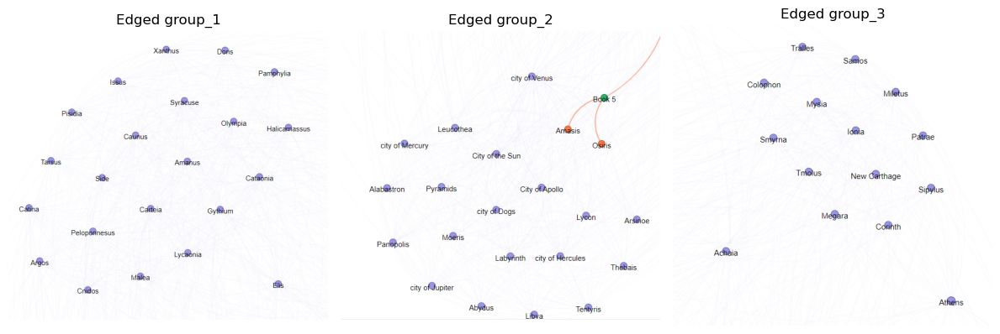

In [164]:
#| label: fig-nw_edged_groups
#| fig-cap: Example of edged groups in the network graph of India-related text in *Natural History*

from PIL import Image

# Open the images using PIL
image1 = Image.open('nw_zoom_distanced_group1.png')
image2 = Image.open('nw_zoom_distanced_group2.png')
image3 = Image.open('nw_zoom_distanced_group3.png')

# Create a 1x3 subplot grid
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(image1)
plt.axis('off')  # Hide the axes
plt.title('Edged group_1')

plt.subplot(1, 3, 2)
plt.imshow(image2)
plt.axis('off')  # Hide the axes
plt.title('Edged group_2')

plt.subplot(1, 3, 3)
plt.imshow(image3)
plt.axis('off')  # Hide the axes
plt.title('Edged group_3')

# Adjust spacing between subplots
plt.tight_layout()

# Show the images in one row
plt.show()

And there are three obvious person name clusters centering on Book 6, Book 7 and Book 37, the zoomed in captures are shown in @fig-network_zoom_book6n7 (for Book 6 and Book 7) and @fig-network_zoom_book37 (for Book 37).

From the cluster of Book 6, the most frequent mentioned historical figures are Alexander the Great, and Dionysus (often with a variant name as "Father Liber"), which has been mentioned to be related to the epic and history of conquest from Roman Empire to Indian subcontinent. Also other governers/generals/navigators have significant connectness within the discourse, such as "Juba II", "Ptolemy II Philadelphus", "Hippalus", "Patrocles", "Leonnatus" etc. And it also show the frequent referred scholars of Pliny in the India-related narratives, for example, "Seneca", "Eratosthenes", "Posidonius of Apameia".

And in the cluster of Book 7, where the discussion focus is on anthropology (human races, tribes, human behaviors), a group of scholars are significantly referred, including "Aristotle", "Eudoxus of Cnidus", "Duris", "Agatharchides".

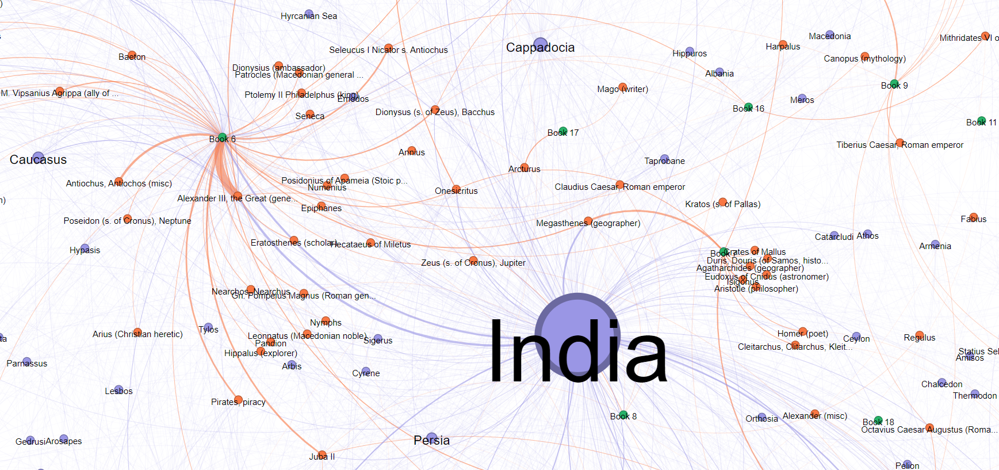

In [160]:
#| label: fig-network_zoom_book6n7
#| fig-cap: Clusters of Book 6 & Book 7 in India-related content in *Natural History* 

Image(filename='nw_zoom_book6&7.png')

While in the cluster of Book 37, strong edges are connected to Greek scholars, such as "Xenocrates", "Aeschylus", "Sudines" and "Zenothemis". Also there is a significant connectness with "Magi", referring to the priests in Zoroastrianism mentioned in the discussion about tales and myths related to the precious stones. An interesting finding in close reading is that in Book 37, Pliny had addressed direct disprovement to these two groups, with a strong critical attitude. As quoted in the following paragraphs, the Greek scholars and Magus are often mentioned as debatable subjects in Book 37, as a strategy for him to express his own worship of nature and the material world.

>37.11.2 "Here is an opportunity for **exposing the falsehoods of the Greeks**."

>37.14.1 "Now I shall discuss those kinds of gemstones that are acknowledged as such, beginning with the finest. And this shall not be my only aim, but to the greater profit of mankind **I shall incidentally confute the abominable falsehoods of the Magi**, since in very many of their statements about gems they have gone far beyond providing an alluring substitute for medical science into the realms of the supernatural."



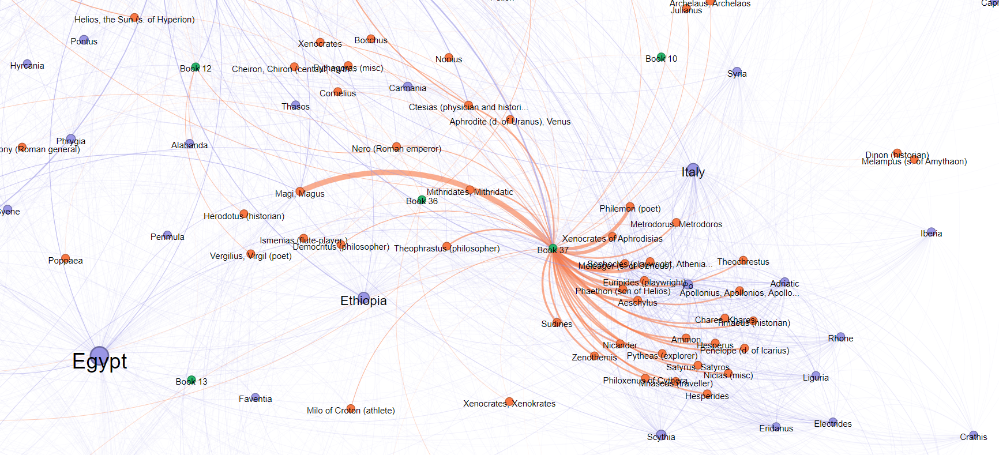

In [161]:
#| label: fig-network_zoom_book37
#| fig-cap: Clusters of Book 37 in India-related content in *Natural History* 

Image(filename='nw_zoom_book37.png')

## Conclusions

### Comprehension of "India" in the narrative
1. geographical contrast (significant standpoint, linked by river); trade partner (frequent trade, importer of numerous rare and precious treasures)
2. three main topics: stones(sole origin and origin of high qualities), origin of marvels and large/good stuff, luxuries trade(criticism), nation history(on and off mentioning the conquest history, in epic, in history), of course it is partly where the knowledge come from, but also show a state of mind of imperialism
3. always mentioned with arabia, ethopia, and person name cluster

### Distant reading as a method
1. help inspire insight, the research question is driven from the premilinary observation
2. combining close reading will have more insights
3. completeness check and validation plays important role, will make great difference in the outcome
4. output of the study that may contribute to further studies: 
-	Creation of a dataset of textual passages from the NH related to India
-	Evaluation and integration of the ToposText annotation in these passages
-	Exploration of the Named Entities connected by Pliny to India


### Reflection and limitation
1. if time permits, mannual check of geo annotation of the whole text will be better
2. topic modelling part, need more fine tuning on the parameters
3. the network part could include more categories, integrate with other types of nodes